In [1]:
!pip install datetime

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

In [3]:
#Exploratory Data Anlysis on Loans data of Private Financial Firm

In [4]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [5]:
data=pd.read_csv("LoansData (1).csv")
data.head()

,LoanID,Amount.Requested,Amount.Funded.By.Investors,Interest.Rate,Loan.Length,Loan.Purpose,Debt.To.Income.Ratio,State,Home.Ownership,Monthly.Income,FICO.Range,Open.CREDIT.Lines,Revolving.CREDIT.Balance,Inquiries.in.the.Last.6.Months,Employment.Length
0,1,20000.0,20000.0,8.90%,36 months,debt_consolidation,14.90%,SC,MORTGAGE,6541.67,735-739,14.0,14272.0,2.0,< 1 year
1,2,19200.0,19200.0,12.12%,36 months,debt_consolidation,28.36%,TX,MORTGAGE,4583.33,715-719,12.0,11140.0,1.0,2 years
2,3,35000.0,35000.0,21.98%,60 months,debt_consolidation,23.81%,CA,MORTGAGE,11500.00,690-694,14.0,21977.0,1.0,2 years
3,4,10000.0,9975.0,9.99%,36 months,debt_consolidation,14.30%,KS,MORTGAGE,3833.33,695-699,10.0,9346.0,0.0,5 years
4,5,12000.0,12000.0,11.71%,36 months,credit_card,18.78%,NJ,RENT,3195.00,695-699,11.0,14469.0,0.0,9 years


In [6]:
data.shape

(2500, 15)

There are 2500 observations and 15 variables in given dataframe

Renaming the variables as per the Naming Convention.

## Checking the Meta data of the Loans data using the info() function and detecting the discrepancies in the data.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LoanID                          2500 non-null   int64  
 1   Amount.Requested                2499 non-null   float64
 2   Amount.Funded.By.Investors      2499 non-null   float64
 3   Interest.Rate                   2498 non-null   object 
 4   Loan.Length                     2500 non-null   object 
 5   Loan.Purpose                    2500 non-null   object 
 6   Debt.To.Income.Ratio            2499 non-null   object 
 7   State                           2500 non-null   object 
 8   Home.Ownership                  2499 non-null   object 
 9   Monthly.Income                  2499 non-null   float64
 10  FICO.Range                      2498 non-null   object 
 11  Open.CREDIT.Lines               2497 non-null   float64
 12  Revolving.CREDIT.Balance        24

# #Performing necessary datatype conversion on the data 

In [8]:
data.columns = [i.replace('.','_') for i in data.columns]

In [9]:
data.columns

Index(['LoanID', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Loan_Purpose', 'Debt_To_Income_Ratio',
       'State', 'Home_Ownership', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length'],
      dtype='object')

In [10]:
data['Interest_Rate'] = data['Interest_Rate'].str.replace('%','').astype('float')
data

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Loan_Purpose,Debt_To_Income_Ratio,State,Home_Ownership,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36 months,debt_consolidation,14.90%,SC,MORTGAGE,6541.67,735-739,14.0,14272.0,2.0,< 1 year
1,2,19200.0,19200.00,12.12,36 months,debt_consolidation,28.36%,TX,MORTGAGE,4583.33,715-719,12.0,11140.0,1.0,2 years
2,3,35000.0,35000.00,21.98,60 months,debt_consolidation,23.81%,CA,MORTGAGE,11500.00,690-694,14.0,21977.0,1.0,2 years
3,4,10000.0,9975.00,9.99,36 months,debt_consolidation,14.30%,KS,MORTGAGE,3833.33,695-699,10.0,9346.0,0.0,5 years
4,5,12000.0,12000.00,11.71,36 months,credit_card,18.78%,NJ,RENT,3195.00,695-699,11.0,14469.0,0.0,9 years
5,6,6000.0,6000.00,15.31,36 months,other,20.05%,CT,OWN,4891.67,670-674,17.0,10391.0,2.0,3 years
6,7,10000.0,10000.00,7.90,36 months,debt_consolidation,26.09%,MA,RENT,2916.67,720-724,10.0,15957.0,0.0,10+ years
7,8,33500.0,33450.00,17.14,60 months,credit_card,14.70%,LA,MORTGAGE,13863.42,705-709,12.0,27874.0,0.0,10+ years
8,9,14675.0,14675.00,14.33,36 months,credit_card,26.92%,CA,RENT,3150.00,685-689,9.0,7246.0,1.0,8 years
9,10,7000.0,7000.00,6.91,36 months,credit_card,7.10%,CA,RENT,5000.00,715-719,8.0,7612.0,0.0,3 years


In [11]:
data['Loan_Length'] = data['Loan_Length'].str.replace('months','').astype('float')

In [12]:
data['Debt_To_Income_Ratio'] = data['Debt_To_Income_Ratio'].str.replace('%','').astype('float')

In [13]:
data['FICO_Range'] = data['FICO_Range'].str.split('-',expand = True)[0].astype('float')

In [14]:
data['Employment_Length'] = data['Employment_Length'].str.replace('years','').str.replace('year','').str.replace('<','').str.replace('+','').astype('float')

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\2527011826.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  data['Employment_Length'] = data['Employment_Length'].str.replace('years','').str.replace('year','').str.replace('<','').str.replace('+','').astype('float')


In [15]:
data

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Loan_Purpose,Debt_To_Income_Ratio,State,Home_Ownership,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36.0,debt_consolidation,14.90,SC,MORTGAGE,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.00,12.12,36.0,debt_consolidation,28.36,TX,MORTGAGE,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.00,21.98,60.0,debt_consolidation,23.81,CA,MORTGAGE,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.00,9.99,36.0,debt_consolidation,14.30,KS,MORTGAGE,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.00,11.71,36.0,credit_card,18.78,NJ,RENT,3195.00,695.0,11.0,14469.0,0.0,9.0
5,6,6000.0,6000.00,15.31,36.0,other,20.05,CT,OWN,4891.67,670.0,17.0,10391.0,2.0,3.0
6,7,10000.0,10000.00,7.90,36.0,debt_consolidation,26.09,MA,RENT,2916.67,720.0,10.0,15957.0,0.0,10.0
7,8,33500.0,33450.00,17.14,60.0,credit_card,14.70,LA,MORTGAGE,13863.42,705.0,12.0,27874.0,0.0,10.0
8,9,14675.0,14675.00,14.33,36.0,credit_card,26.92,CA,RENT,3150.00,685.0,9.0,7246.0,1.0,8.0
9,10,7000.0,7000.00,6.91,36.0,credit_card,7.10,CA,RENT,5000.00,715.0,8.0,7612.0,0.0,3.0


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LoanID                          2500 non-null   int64  
 1   Amount_Requested                2499 non-null   float64
 2   Amount_Funded_By_Investors      2499 non-null   float64
 3   Interest_Rate                   2498 non-null   float64
 4   Loan_Length                     2500 non-null   float64
 5   Loan_Purpose                    2500 non-null   object 
 6   Debt_To_Income_Ratio            2499 non-null   float64
 7   State                           2500 non-null   object 
 8   Home_Ownership                  2499 non-null   object 
 9   Monthly_Income                  2499 non-null   float64
 10  FICO_Range                      2498 non-null   float64
 11  Open_CREDIT_Lines               2497 non-null   float64
 12  Revolving_CREDIT_Balance        24

# #Separating the categorical and numerical columns from the data in two separate datframe

In [17]:
categorical = [var for var in data.columns if data[var].dtype == 'O']

In [18]:
cat_data=data[categorical]

In [19]:
cat_data.head()

,Loan_Purpose,State,Home_Ownership
0,debt_consolidation,SC,MORTGAGE
1,debt_consolidation,TX,MORTGAGE
2,debt_consolidation,CA,MORTGAGE
3,debt_consolidation,KS,MORTGAGE
4,credit_card,NJ,RENT


In [20]:
numerical = [var for var in data.columns if data[var].dtype != 'O']

In [21]:
num_data=data[numerical]

In [22]:
num_data.head()

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0


In [23]:
cat_data.shape

(2500, 3)

In [24]:
num_data.shape

(2500, 12)

In [25]:
cat_data['LoanID']=data['LoanID']

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\2953330015.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['LoanID']=data['LoanID']


In [26]:
cat_data.head()

,Loan_Purpose,State,Home_Ownership,LoanID
0,debt_consolidation,SC,MORTGAGE,1
1,debt_consolidation,TX,MORTGAGE,2
2,debt_consolidation,CA,MORTGAGE,3
3,debt_consolidation,KS,MORTGAGE,4
4,credit_card,NJ,RENT,5


# Missing value Treatment

### ON  numerical columns

In [27]:
data.isna().sum()

LoanID                             0
Amount_Requested                   1
Amount_Funded_By_Investors         1
Interest_Rate                      2
Loan_Length                        0
Loan_Purpose                       0
Debt_To_Income_Ratio               1
State                              0
Home_Ownership                     1
Monthly_Income                     1
FICO_Range                         2
Open_CREDIT_Lines                  3
Revolving_CREDIT_Balance           3
Inquiries_in_the_Last_6_Months     3
Employment_Length                 77
dtype: int64

In [28]:
#data['Amount_Requested ']=data['Amount_Requested '].fillna(data['Amount_Requested '].median())

In [29]:
for i in num_data:
    num_data[i]=num_data[i].fillna(num_data[i].median())

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\3310735158.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_data[i]=num_data[i].fillna(num_data[i].median())


In [30]:
num_data.isna().sum()

LoanID                            0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Debt_To_Income_Ratio              0
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

### On categorical columns

# Separating the categorical Variables and Numerical variables into two different datasets for Data Preparations for Data Analysis.¶

In [31]:
cat_data.head()

,Loan_Purpose,State,Home_Ownership,LoanID
0,debt_consolidation,SC,MORTGAGE,1
1,debt_consolidation,TX,MORTGAGE,2
2,debt_consolidation,CA,MORTGAGE,3
3,debt_consolidation,KS,MORTGAGE,4
4,credit_card,NJ,RENT,5


In [32]:
for i in cat_data:
    cat_data[i]=cat_data[i].fillna(cat_data[i].mode())

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\1470946784.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data[i]=cat_data[i].fillna(cat_data[i].mode())
C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\1470946784.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data[i]=cat_data[i].fillna(cat_data[i].mode())
C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\1470946784.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_

In [33]:
cat_data.isna().sum()

Loan_Purpose      0
State             0
Home_Ownership    1
LoanID            0
dtype: int64

In [34]:
cat_data['Home_Ownership'].value_counts()

MORTGAGE    1147
RENT        1146
OWN          200
OTHER          5
NONE           1
Name: Home_Ownership, dtype: int64

In [35]:
cat_data['State'].value_counts()

CA    433
NY    255
TX    174
FL    169
IL    101
GA     98
PA     96
NJ     94
VA     78
MA     73
OH     71
MD     68
NC     64
CO     61
WA     58
CT     50
AZ     46
MI     45
MN     38
AL     38
MO     33
NV     32
OR     30
SC     28
WI     26
KY     23
LA     22
OK     21
KS     21
UT     16
NH     15
RI     15
WV     15
NM     13
AR     13
HI     12
AK     11
DC     11
DE      8
MT      7
VT      5
SD      4
WY      4
IN      3
IA      1
MS      1
Name: State, dtype: int64

In [36]:
cat_data['Loan_Purpose'].value_counts()

debt_consolidation    1307
credit_card            444
other                  201
home_improvement       152
major_purchase         101
small_business          87
car                     50
wedding                 39
medical                 30
moving                  29
vacation                21
house                   20
educational             15
renewable_energy         4
Name: Loan_Purpose, dtype: int64

In [37]:
cat_data[cat_data['Home_Ownership']== 'NaN']

,Loan_Purpose,State,Home_Ownership,LoanID


In [38]:
cat_data['Home_Ownership']

0       MORTGAGE
1       MORTGAGE
2       MORTGAGE
3       MORTGAGE
4           RENT
5            OWN
6           RENT
7       MORTGAGE
8           RENT
9           RENT
10          RENT
11      MORTGAGE
12      MORTGAGE
13          RENT
14          RENT
15          RENT
16          RENT
17          RENT
18          RENT
19      MORTGAGE
20      MORTGAGE
21      MORTGAGE
22          RENT
23          RENT
24      MORTGAGE
25          RENT
26          RENT
27      MORTGAGE
28      MORTGAGE
29      MORTGAGE
30      MORTGAGE
31      MORTGAGE
32      MORTGAGE
33          RENT
34           OWN
35      MORTGAGE
36          RENT
37      MORTGAGE
38          RENT
39      MORTGAGE
40      MORTGAGE
41          RENT
42          RENT
43          RENT
44          RENT
45          RENT
46          RENT
47      MORTGAGE
48      MORTGAGE
49      MORTGAGE
50          RENT
51          RENT
52          RENT
53          RENT
54           OWN
55          RENT
56          RENT
57      MORTGAGE
58      MORTGA

In [39]:
cat_data.loc[2492]

Loan_Purpose      debt_consolidation
State                             NJ
Home_Ownership                   NaN
LoanID                          2493
Name: 2492, dtype: object

In [40]:
cat_data=cat_data.drop(2492)

In [41]:
num_data.isna().sum()

LoanID                            0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Debt_To_Income_Ratio              0
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

In [42]:
num_data = num_data.drop(2492)

In [43]:
cat_data.reset_index(inplace=True)

In [44]:
num_data.reset_index(inplace=True)

In [45]:
cat_data=cat_data.drop(columns='index')

In [46]:
num_data=num_data.drop(columns='index')

In [47]:
cat_data

,Loan_Purpose,State,Home_Ownership,LoanID
0,debt_consolidation,SC,MORTGAGE,1
1,debt_consolidation,TX,MORTGAGE,2
2,debt_consolidation,CA,MORTGAGE,3
3,debt_consolidation,KS,MORTGAGE,4
4,credit_card,NJ,RENT,5
5,other,CT,OWN,6
6,debt_consolidation,MA,RENT,7
7,credit_card,LA,MORTGAGE,8
8,credit_card,CA,RENT,9
9,credit_card,CA,RENT,10


In [48]:
num_data

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.00,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.00,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.00,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.00,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0
5,6,6000.0,6000.00,15.31,36.0,20.05,4891.67,670.0,17.0,10391.0,2.0,3.0
6,7,10000.0,10000.00,7.90,36.0,26.09,2916.67,720.0,10.0,15957.0,0.0,10.0
7,8,33500.0,33450.00,17.14,60.0,14.70,13863.42,705.0,12.0,27874.0,0.0,10.0
8,9,14675.0,14675.00,14.33,36.0,26.92,3150.00,685.0,9.0,7246.0,1.0,8.0
9,10,7000.0,7000.00,6.91,36.0,7.10,5000.00,715.0,8.0,7612.0,0.0,3.0


In [49]:
cat_data.isna().sum()

Loan_Purpose      0
State             0
Home_Ownership    0
LoanID            0
dtype: int64

In [50]:
num_data.isna().sum()

LoanID                            0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Debt_To_Income_Ratio              0
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

In [51]:
#Average monthly income of customers
np.round(data.Monthly_Income.mean(),3)

5688.931

# Data type conversions

In [52]:
data.head(5)

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Loan_Purpose,Debt_To_Income_Ratio,State,Home_Ownership,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,debt_consolidation,14.90,SC,MORTGAGE,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,debt_consolidation,28.36,TX,MORTGAGE,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,debt_consolidation,23.81,CA,MORTGAGE,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,debt_consolidation,14.30,KS,MORTGAGE,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,credit_card,18.78,NJ,RENT,3195.00,695.0,11.0,14469.0,0.0,9.0


In [53]:
data.Employment_Length

0        1.0
1        2.0
2        2.0
3        5.0
4        9.0
5        3.0
6       10.0
7       10.0
8        8.0
9        3.0
10       6.0
11       1.0
12       1.0
13       1.0
14       1.0
15       9.0
16       7.0
17       9.0
18       3.0
19       1.0
20      10.0
21       6.0
22       2.0
23       7.0
24       3.0
25       7.0
26       6.0
27       5.0
28       5.0
29       4.0
30       9.0
31       2.0
32       8.0
33       3.0
34       6.0
35      10.0
36       3.0
37       1.0
38       4.0
39       1.0
40       3.0
41       3.0
42       8.0
43       4.0
44      10.0
45       1.0
46       2.0
47       1.0
48      10.0
49       5.0
50       2.0
51       8.0
52       2.0
53       9.0
54       5.0
55       1.0
56       4.0
57      10.0
58      10.0
59       1.0
60       1.0
61      10.0
62       1.0
63       3.0
64      10.0
65       1.0
66       5.0
67       1.0
68       1.0
69       6.0
70      10.0
71       6.0
72       6.0
73      10.0
74      10.0
75      10.0
76       7.0

# Checking the relevant and irrelevant variables in the first phase of EDA:

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LoanID                          2500 non-null   int64  
 1   Amount_Requested                2499 non-null   float64
 2   Amount_Funded_By_Investors      2499 non-null   float64
 3   Interest_Rate                   2498 non-null   float64
 4   Loan_Length                     2500 non-null   float64
 5   Loan_Purpose                    2500 non-null   object 
 6   Debt_To_Income_Ratio            2499 non-null   float64
 7   State                           2500 non-null   object 
 8   Home_Ownership                  2499 non-null   object 
 9   Monthly_Income                  2499 non-null   float64
 10  FICO_Range                      2498 non-null   float64
 11  Open_CREDIT_Lines               2497 non-null   float64
 12  Revolving_CREDIT_Balance        24

In [58]:
data.nunique()

LoanID                            2500
Amount_Requested                   380
Amount_Funded_By_Investors         710
Interest_Rate                      275
Loan_Length                          2
Loan_Purpose                        14
Debt_To_Income_Ratio              1669
State                               46
Home_Ownership                       5
Monthly_Income                     632
FICO_Range                          38
Open_CREDIT_Lines                   29
Revolving_CREDIT_Balance          2349
Inquiries_in_the_Last_6_Months      10
Employment_Length                   10
dtype: int64

In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LoanID                          2500 non-null   int64  
 1   Amount_Requested                2499 non-null   float64
 2   Amount_Funded_By_Investors      2499 non-null   float64
 3   Interest_Rate                   2498 non-null   float64
 4   Loan_Length                     2500 non-null   float64
 5   Loan_Purpose                    2500 non-null   object 
 6   Debt_To_Income_Ratio            2499 non-null   float64
 7   State                           2500 non-null   object 
 8   Home_Ownership                  2499 non-null   object 
 9   Monthly_Income                  2499 non-null   float64
 10  FICO_Range                      2498 non-null   float64
 11  Open_CREDIT_Lines               2497 non-null   float64
 12  Revolving_CREDIT_Balance        24

In [60]:
data['Loan_Length'].value_counts()

36.0    1952
60.0     548
Name: Loan_Length, dtype: int64

36.0    1952
60.0     548
Name: Loan_Length, dtype: int64


Text(0, 0.5, 'No of Customers')

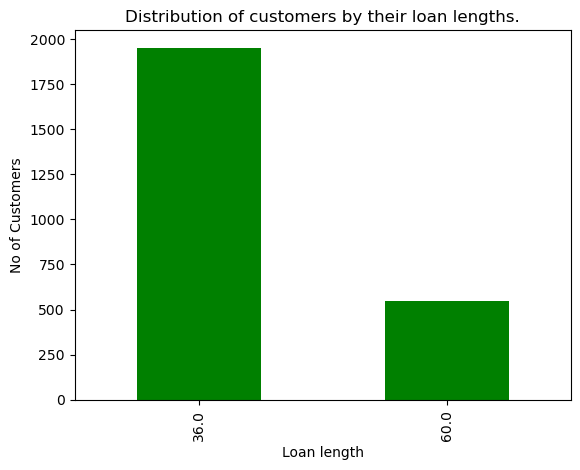

In [64]:
print(data['Loan_Length'].value_counts())
data['Loan_Length'].value_counts().plot(kind='bar',color='green')
plt.title("Distribution of customers by their loan lengths.")
plt.xlabel("Loan length")
plt.ylabel("No of Customers")

# Distrbution of  customers by state:

CA    433
NY    255
TX    174
FL    169
IL    101
GA     98
PA     96
NJ     94
VA     78
MA     73
OH     71
MD     68
NC     64
CO     61
WA     58
CT     50
AZ     46
MI     45
MN     38
AL     38
MO     33
NV     32
OR     30
SC     28
WI     26
KY     23
LA     22
OK     21
KS     21
UT     16
NH     15
RI     15
WV     15
NM     13
AR     13
HI     12
AK     11
DC     11
DE      8
MT      7
VT      5
SD      4
WY      4
IN      3
IA      1
MS      1
Name: State, dtype: int64


Text(0, 0.5, 'No of customers')

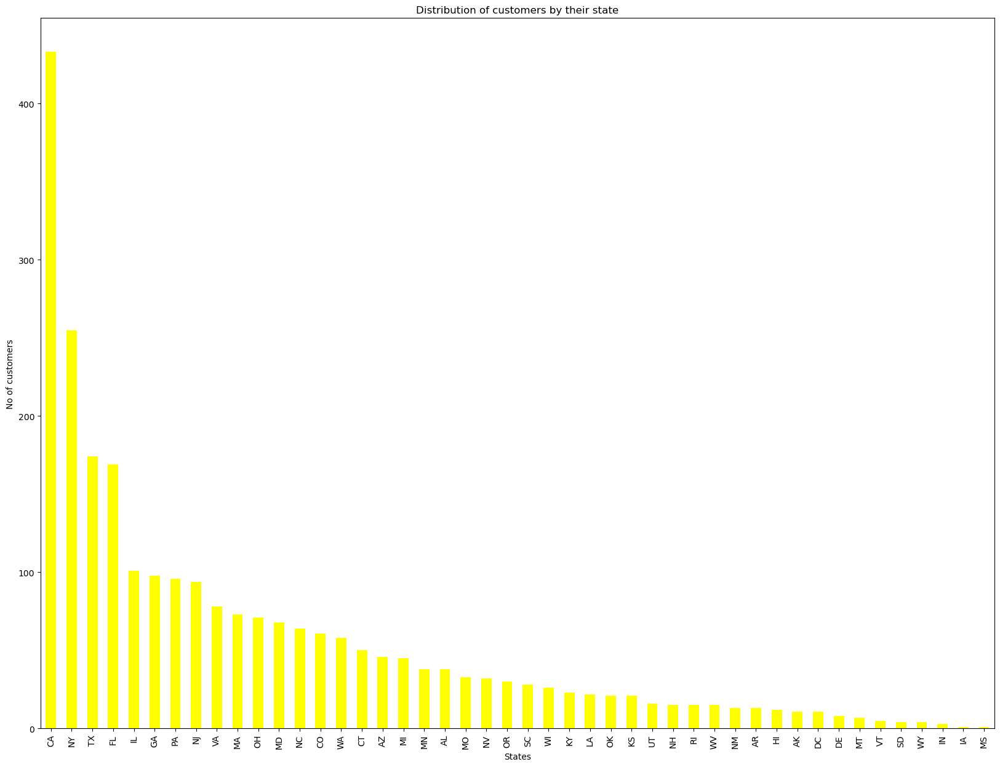

In [65]:
print(data['State'].value_counts())
data['State'].value_counts().plot(kind='bar',color='yellow',figsize=(20,15))
plt.title("Distribution of customers by their state")
plt.xlabel('States')
plt.ylabel('No of customers')

debt_consolidation    1307
credit_card            444
other                  201
home_improvement       152
major_purchase         101
small_business          87
car                     50
wedding                 39
medical                 30
moving                  29
vacation                21
house                   20
educational             15
renewable_energy         4
Name: Loan_Purpose, dtype: int64


Text(0, 0.5, 'No of customers')

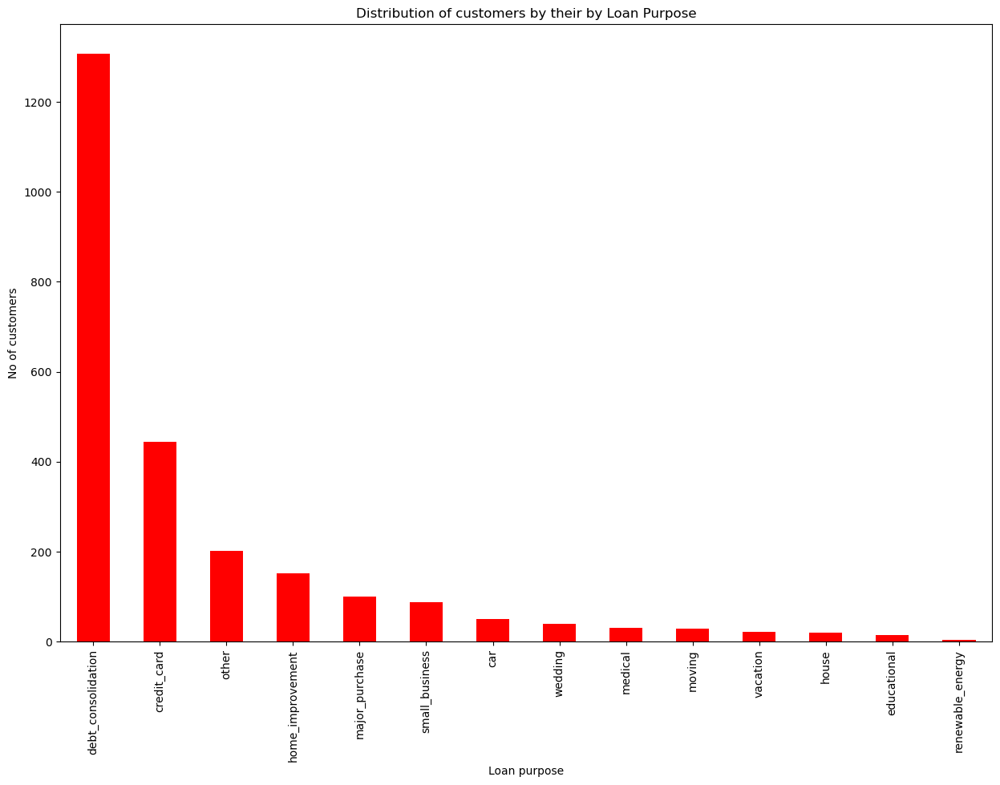

In [67]:
print(data['Loan_Purpose'].value_counts())
data['Loan_Purpose'].value_counts().plot(kind='bar',color='red',figsize=(15,10))
plt.title("Distribution of customers by their by Loan Purpose")
plt.xlabel('Loan purpose')
plt.ylabel('No of customers')

MORTGAGE    1147
RENT        1146
OWN          200
OTHER          5
NONE           1
Name: Home_Ownership, dtype: int64


Text(0, 0.5, 'No of customers')

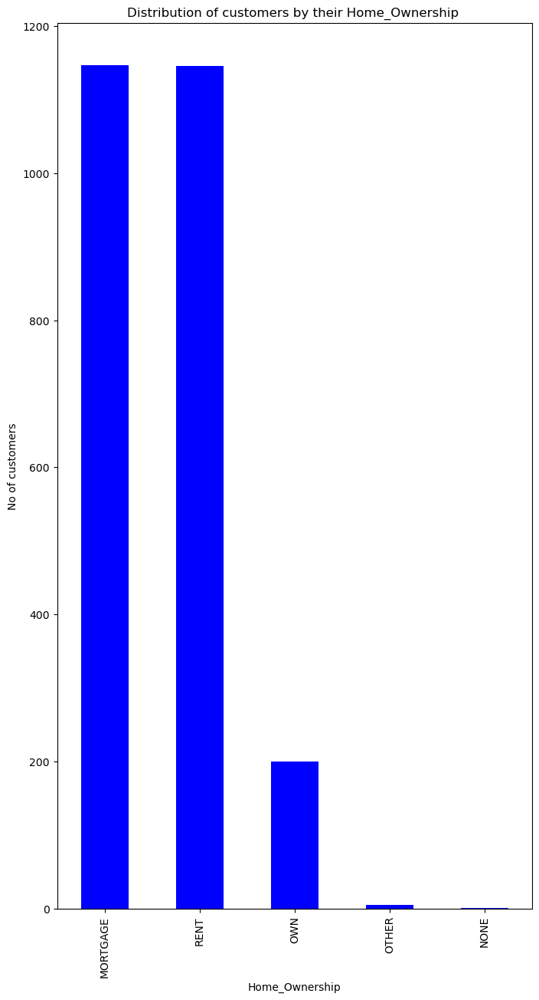

In [69]:
print(data['Home_Ownership'].value_counts())
data['Home_Ownership'].value_counts().plot(kind='bar',color='blue',figsize=(8,15))
plt.title('Distribution of customers by their Home_Ownership ')
plt.xlabel('Home_Ownership')
plt.ylabel('No of customers')

# Data duplicacy :Check if their is dupicate data or not:DDt(Data Duplicacy Treatment)

In [70]:
data.duplicated().value_counts()

False    2500
dtype: int64

In [71]:
data.duplicated().sum()

0

## There is no data duplicacy in our data

# how to rename the variables?

In [72]:
data.columns

Index(['LoanID', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Loan_Purpose', 'Debt_To_Income_Ratio',
       'State', 'Home_Ownership', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length'],
      dtype='object')

In [97]:
data=data.rename(columns={'LoanID':'Loan_id','State':'States'})

In [98]:
data.columns

Index(['Load_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Loan_Purpose', 'Debt_To_Income_Ratio',
       'States', 'Home_Ownership', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length'],
      dtype='object')

# Missing Values Treatment

In [99]:
data.head()

,Load_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Loan_Purpose,Debt_To_Income_Ratio,States,Home_Ownership,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,debt_consolidation,14.90,SC,MORTGAGE,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,debt_consolidation,28.36,TX,MORTGAGE,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,debt_consolidation,23.81,CA,MORTGAGE,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,debt_consolidation,14.30,KS,MORTGAGE,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,credit_card,18.78,NJ,RENT,3195.00,695.0,11.0,14469.0,0.0,9.0


In [100]:
data.Amount_Requested.isna().sum()

0

In [101]:
data.shape

(2500, 15)

In [102]:
data.isna().sum()

Load_id                           0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Loan_Purpose                      0
Debt_To_Income_Ratio              0
States                            0
Home_Ownership                    1
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

In [103]:
(data.isna().sum()/data.shape[0])*100

Load_id                           0.00
Amount_Requested                  0.00
Amount_Funded_By_Investors        0.00
Interest_Rate                     0.00
Loan_Length                       0.00
Loan_Purpose                      0.00
Debt_To_Income_Ratio              0.00
States                            0.00
Home_Ownership                    0.04
Monthly_Income                    0.00
FICO_Range                        0.00
Open_CREDIT_Lines                 0.00
Revolving_CREDIT_Balance          0.00
Inquiries_in_the_Last_6_Months    0.00
Employment_Length                 0.00
dtype: float64

### We have the maximum of 3% values missing in the Employment length variable.


Creating a UDF which can automate the missing value treatment.

In [104]:
data.shape

(2500, 15)

In [105]:
data.columns

Index(['Load_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Loan_Purpose', 'Debt_To_Income_Ratio',
       'States', 'Home_Ownership', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length'],
      dtype='object')

In [106]:
def miss_value_treat(s):
    if s.dtype=='O':
        s=s.fillna(s.mode())
    else:
        s=s.fillna(s.median())
    return s    

In [107]:
data=data.apply(miss_value_treat)

In [108]:
data.isna().sum()

Load_id                           0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Loan_Purpose                      0
Debt_To_Income_Ratio              0
States                            0
Home_Ownership                    1
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

In [109]:
data['Amount_Requested']=data.Amount_Requested.fillna(data['Amount_Requested'].median())

In [110]:
data['Amount_Funded_By_Investors']=data.Amount_Funded_By_Investors.fillna(data['Amount_Funded_By_Investors'].median())

In [111]:
data.isna().sum()

Load_id                           0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Loan_Purpose                      0
Debt_To_Income_Ratio              0
States                            0
Home_Ownership                    1
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Load_id                         2500 non-null   int64  
 1   Amount_Requested                2500 non-null   float64
 2   Amount_Funded_By_Investors      2500 non-null   float64
 3   Interest_Rate                   2500 non-null   float64
 4   Loan_Length                     2500 non-null   float64
 5   Loan_Purpose                    2500 non-null   object 
 6   Debt_To_Income_Ratio            2500 non-null   float64
 7   States                          2500 non-null   object 
 8   Home_Ownership                  2499 non-null   object 
 9   Monthly_Income                  2500 non-null   float64
 10  FICO_Range                      2500 non-null   float64
 11  Open_CREDIT_Lines               2500 non-null   float64
 12  Revolving_CREDIT_Balance        25

In [113]:
data.columns

Index(['Load_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Loan_Purpose', 'Debt_To_Income_Ratio',
       'States', 'Home_Ownership', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length'],
      dtype='object')

# Separating the categorical Variables and Numerical variables into two different datasets for Data Preparations for Data Analysis.¶

In [114]:
categorical = [var for var in data.columns if data[var].dtype == 'O']

In [115]:
categorical

['Loan_Purpose', 'States', 'Home_Ownership']

In [116]:
cat_data=data[categorical]

In [122]:
data=data.rename(columns={'Load_id':'Loan_id'})

In [124]:
cat_data['Loan_id']=data['Loan_id']

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\2578641846.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['Loan_id']=data['Loan_id']


In [125]:
cat_data

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id
0,debt_consolidation,SC,MORTGAGE,1,1
1,debt_consolidation,TX,MORTGAGE,2,2
2,debt_consolidation,CA,MORTGAGE,3,3
3,debt_consolidation,KS,MORTGAGE,4,4
4,credit_card,NJ,RENT,5,5
5,other,CT,OWN,6,6
6,debt_consolidation,MA,RENT,7,7
7,credit_card,LA,MORTGAGE,8,8
8,credit_card,CA,RENT,9,9
9,credit_card,CA,RENT,10,10


In [126]:
cat_data.shape

(2500, 5)

In [128]:
numerical=[var for var in data.columns if data[var].dtype !='O']

In [129]:
num_data=data[numerical]

In [130]:
num_data

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.00,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.00,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.00,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.00,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0
5,6,6000.0,6000.00,15.31,36.0,20.05,4891.67,670.0,17.0,10391.0,2.0,3.0
6,7,10000.0,10000.00,7.90,36.0,26.09,2916.67,720.0,10.0,15957.0,0.0,10.0
7,8,33500.0,33450.00,17.14,60.0,14.70,13863.42,705.0,12.0,27874.0,0.0,10.0
8,9,14675.0,14675.00,14.33,36.0,26.92,3150.00,685.0,9.0,7246.0,1.0,8.0
9,10,7000.0,7000.00,6.91,36.0,7.10,5000.00,715.0,8.0,7612.0,0.0,3.0


# filling misssing values in numerical data with Median values

In [131]:
for i in num_data.columns:
    num_data[i]=num_data[i].fillna(num_data[i].median())

C:\Users\ASUS\AppData\Local\Temp\ipykernel_3040\4067871884.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_data[i]=num_data[i].fillna(num_data[i].median())


In [132]:
num_data.isna().sum()

Loan_id                           0
Amount_Requested                  0
Amount_Funded_By_Investors        0
Interest_Rate                     0
Loan_Length                       0
Debt_To_Income_Ratio              0
Monthly_Income                    0
FICO_Range                        0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
dtype: int64

# filling missing values in categorical data with the Mode Values

In [135]:
for i in cat_data.columns:
    cat_data[i]=cat_data[i].fillna(cat_data[i].mode())

In [134]:
cat_data.isna().sum()

Loan_Purpose      0
States            0
Home_Ownership    1
Load_id           0
Loan_id           0
dtype: int64

In [136]:
cat_data.Home_Ownership.count()

2499

In [137]:
cat_data.Home_Ownership.value_counts()

MORTGAGE    1147
RENT        1146
OWN          200
OTHER          5
NONE           1
Name: Home_Ownership, dtype: int64

In [138]:
cat_data.loc[cat_data['Home_Ownership']==None]

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id


In [139]:
s=pd.Series(cat_data.Home_Ownership.isna())
s[s==True]

2492    True
Name: Home_Ownership, dtype: bool

In [140]:
cat_data.loc[2492,]

Loan_Purpose      debt_consolidation
States                            NJ
Home_Ownership                   NaN
Load_id                         2493
Loan_id                         2493
Name: 2492, dtype: object

In [141]:
cat_data['Home_Ownership']  = cat_data['Home_Ownership'].replace("NaN",None)

In [142]:
cat_data.Home_Ownership.value_counts()

MORTGAGE    1147
RENT        1146
OWN          200
OTHER          5
NONE           1
Name: Home_Ownership, dtype: int64

In [143]:
cat_data.isna().sum()

Loan_Purpose      0
States            0
Home_Ownership    1
Load_id           0
Loan_id           0
dtype: int64

In [144]:
cat_data.tail(10)

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id
2490,debt_consolidation,CA,RENT,2491,2491
2491,debt_consolidation,CA,RENT,2492,2492
2492,debt_consolidation,NJ,NaN,2493,2493
2493,other,IL,MORTGAGE,2494,2494
2494,debt_consolidation,WA,MORTGAGE,2495,2495
2495,debt_consolidation,NY,MORTGAGE,2496,2496
2496,home_improvement,MD,OWN,2497,2497
2497,debt_consolidation,PA,MORTGAGE,2498,2498
2498,major_purchase,NJ,RENT,2499,2499
2499,debt_consolidation,NY,RENT,2500,2500


In [145]:
cata_data=cat_data.drop(2492)

In [146]:
cat_data.tail(10)

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id
2490,debt_consolidation,CA,RENT,2491,2491
2491,debt_consolidation,CA,RENT,2492,2492
2492,debt_consolidation,NJ,NaN,2493,2493
2493,other,IL,MORTGAGE,2494,2494
2494,debt_consolidation,WA,MORTGAGE,2495,2495
2495,debt_consolidation,NY,MORTGAGE,2496,2496
2496,home_improvement,MD,OWN,2497,2497
2497,debt_consolidation,PA,MORTGAGE,2498,2498
2498,major_purchase,NJ,RENT,2499,2499
2499,debt_consolidation,NY,RENT,2500,2500


In [147]:
cat_data.isna().sum()

Loan_Purpose      0
States            0
Home_Ownership    1
Load_id           0
Loan_id           0
dtype: int64

In [148]:
cat_data.shape

(2500, 5)

In [150]:
num_data=num_data.drop(2492)

In [151]:
num_data.shape

(2499, 12)

# merging two datasets there should be a common column

In [152]:
cat_data.head(2)

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id
0,debt_consolidation,SC,MORTGAGE,1,1
1,debt_consolidation,TX,MORTGAGE,2,2


In [153]:
num_data.head(2)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0


# Outlier Treatment

In [154]:
num_data.head()

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0


### Just observing a single column for the outliers

In [155]:
num_data.describe()

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
count,2499.000000,2499.000000,2499.00000,2499.000000,2499.000000,2499.000000,2499.000000,2499.000000,2499.000000,2499.000000,2499.000000,2499.00000
mean,1250.002801,12406.902761,12003.83477,13.066619,41.262905,15.380420,5688.864626,705.898359,10.073629,15221.817127,0.905162,5.47499
std,721.548325,7802.156772,7746.04527,4.175938,9.932322,7.505052,3963.128380,35.035486,4.504621,18273.326539,1.230862,3.38905
min,1.000000,1000.000000,-0.01000,5.420000,36.000000,0.000000,588.500000,640.000000,2.000000,0.000000,0.000000,1.00000
25%,625.500000,6000.000000,6000.00000,10.160000,36.000000,9.750000,3500.000000,680.000000,7.000000,5587.500000,0.000000,2.00000
50%,1250.000000,10000.000000,10000.00000,13.110000,36.000000,15.320000,5000.000000,700.000000,9.000000,10948.000000,0.000000,5.00000
75%,1874.500000,17000.000000,16000.00000,15.800000,36.000000,20.675000,6800.000000,725.000000,13.000000,18849.500000,1.000000,10.00000
max,2500.000000,35000.000000,35000.00000,24.890000,60.000000,34.910000,102750.000000,830.000000,38.000000,270800.000000,9.000000,10.00000


In [157]:
min_Amt=num_data.Amount_Requested.min()
min_Amt

1000.0

In [158]:
max_Amt=num_data.Amount_Requested.max()
max_Amt

35000.0

### quantile() hepls to find the percentile values at each percentile mark

In [160]:
median=num_data.Amount_Requested.quantile(0.5)
median

10000.0

In [161]:
f_q = num_data.Amount_Requested.quantile(0.25)
t_q = num_data.Amount_Requested.quantile(0.75)
p_1 = num_data.Amount_Requested.quantile(0.01)
p_99 = num_data.Amount_Requested.quantile(0.99)

In [163]:
print("First quartile:",f_q)
print("Third quartile:",t_q)
print("Bottom 1%ile cutoff:",p_1)
print("Top 1%ile cutoff:",p_99)

First quartile: 6000.0
Third quartile: 17000.0
Bottom 1%ile cutoff: 1500.0
Top 1%ile cutoff: 35000.0


In [164]:
#iqr=q3-q1
iqr=17000-6000

In [165]:
iqr

11000

In [166]:
#lc=q1-1.5*iqr
#uc=q3+1.5*iqr

In [167]:
lc=6000-(1.5*iqr)
lc

-10500.0

In [168]:
uc=17000 + (1.5*iqr)
uc

33500.0

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Requested'>

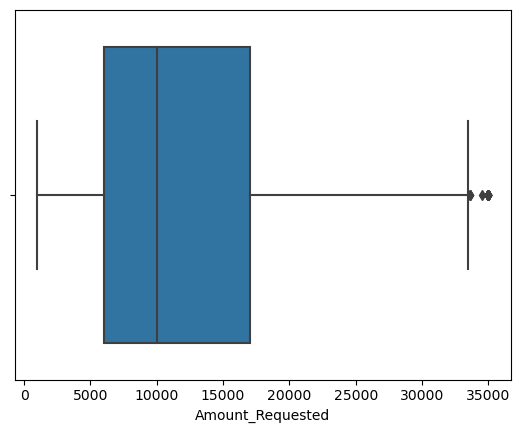

In [169]:
sns.boxplot(num_data.Amount_Requested)

In [170]:
num_data.head()

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0


In [171]:
num_data.Loan_Length.nunique()

2

In [172]:
num_data.Loan_Length.value_counts()

36.0    1951
60.0     548
Name: Loan_Length, dtype: int64

In [173]:
num_data.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

In [174]:
num_data.Inquiries_in_the_Last_6_Months.value_counts()

0.0    1252
1.0     657
2.0     335
3.0     169
4.0      50
5.0      14
6.0       8
7.0       7
9.0       5
8.0       2
Name: Inquiries_in_the_Last_6_Months, dtype: int64

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


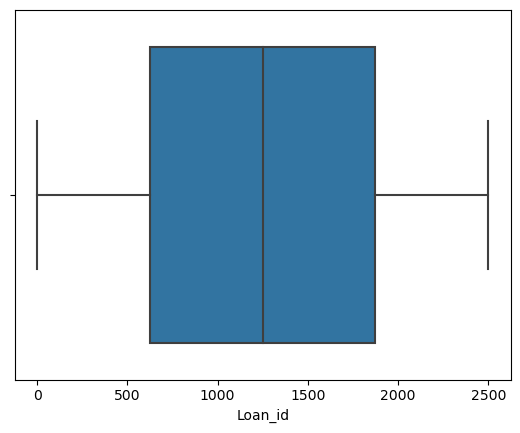

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


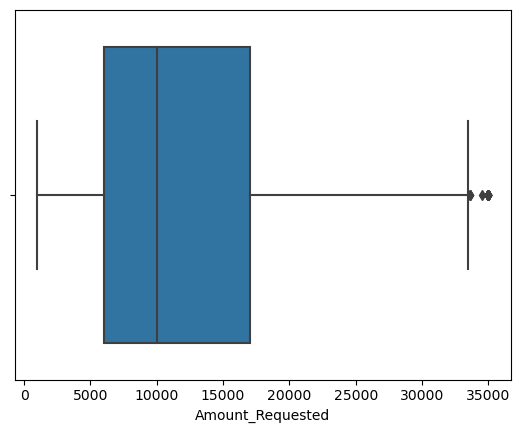

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


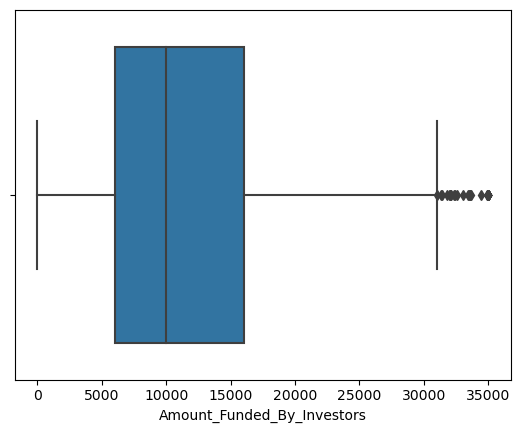

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


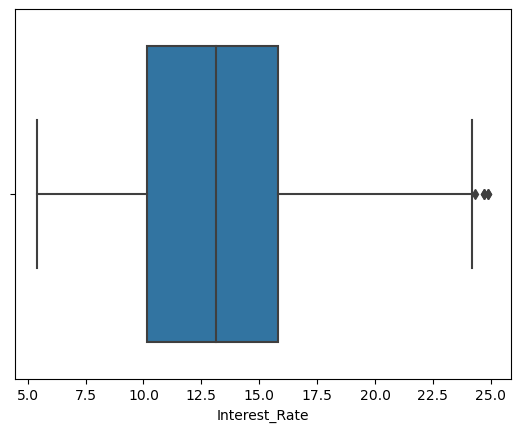

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


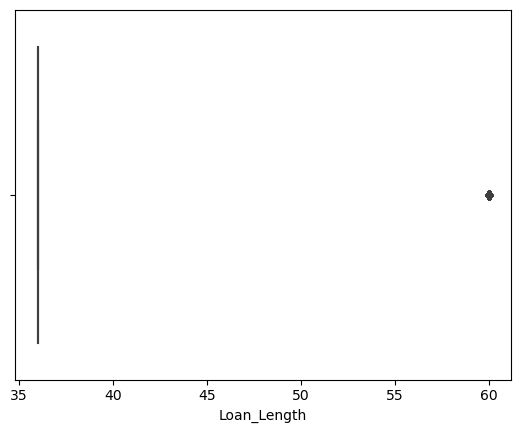

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


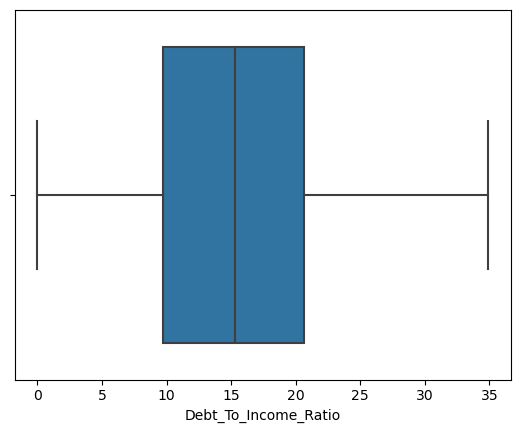

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


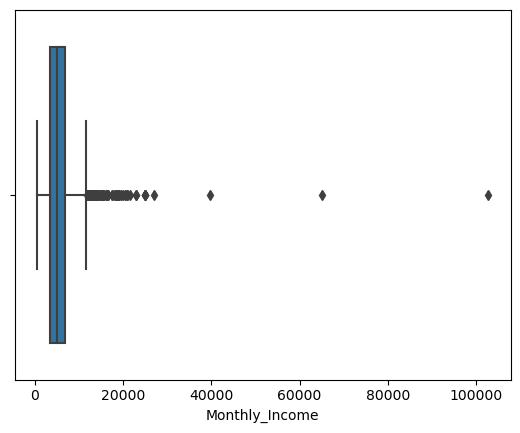

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


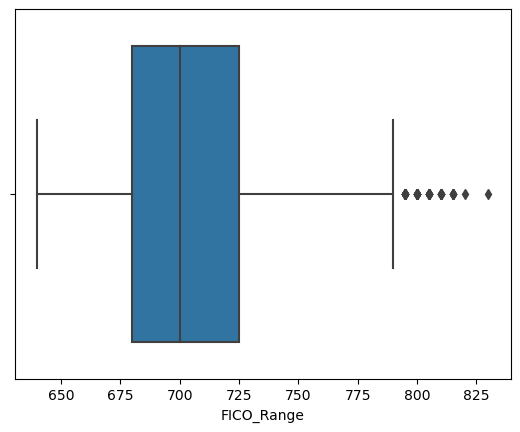

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


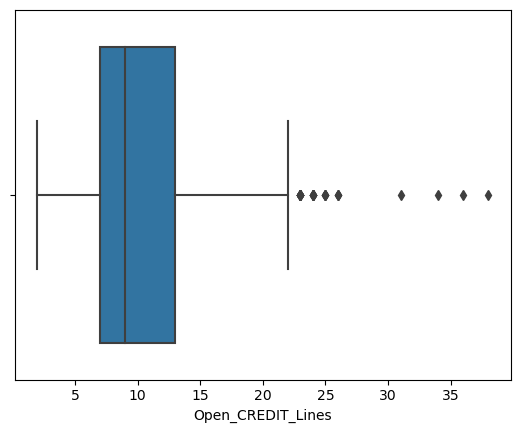

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


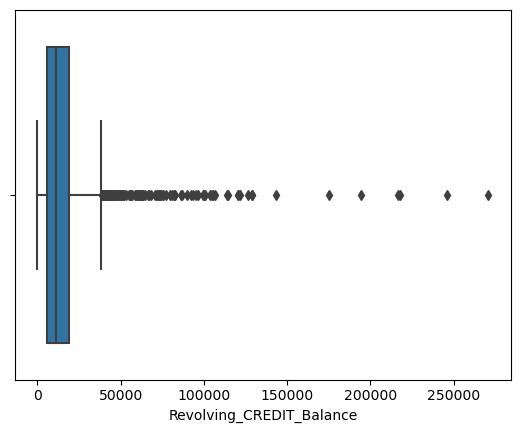

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


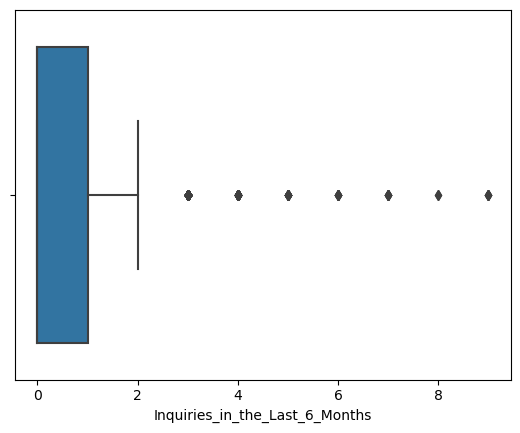

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


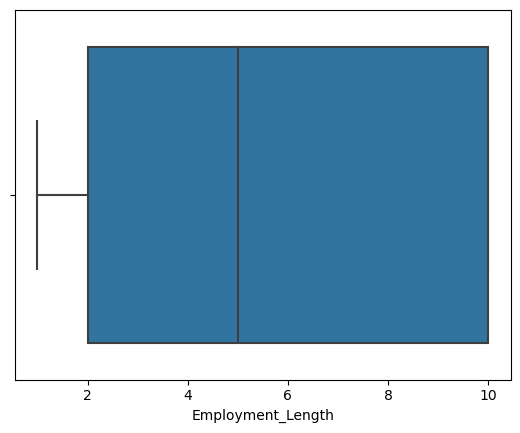

In [175]:
for col in num_data:
    sns.boxplot(num_data[col])
    plt.show()

In [176]:
num_data2=num_data.copy()

In [177]:
num_data2

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.00,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.00,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.00,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.00,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0
5,6,6000.0,6000.00,15.31,36.0,20.05,4891.67,670.0,17.0,10391.0,2.0,3.0
6,7,10000.0,10000.00,7.90,36.0,26.09,2916.67,720.0,10.0,15957.0,0.0,10.0
7,8,33500.0,33450.00,17.14,60.0,14.70,13863.42,705.0,12.0,27874.0,0.0,10.0
8,9,14675.0,14675.00,14.33,36.0,26.92,3150.00,685.0,9.0,7246.0,1.0,8.0
9,10,7000.0,7000.00,6.91,36.0,7.10,5000.00,715.0,8.0,7612.0,0.0,3.0


In [178]:
lc

-10500.0

In [179]:
uc

33500.0

In [180]:
num_data2['Amount_Requested']=num_data2.Amount_Requested.clip(lower=lc,upper=uc)

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Requested'>

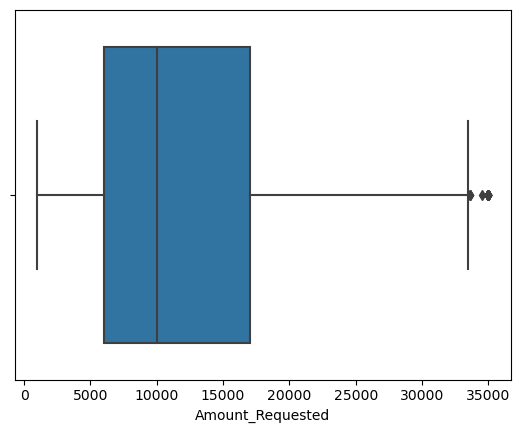

In [181]:
sns.boxplot(num_data.Amount_Requested)

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Requested'>

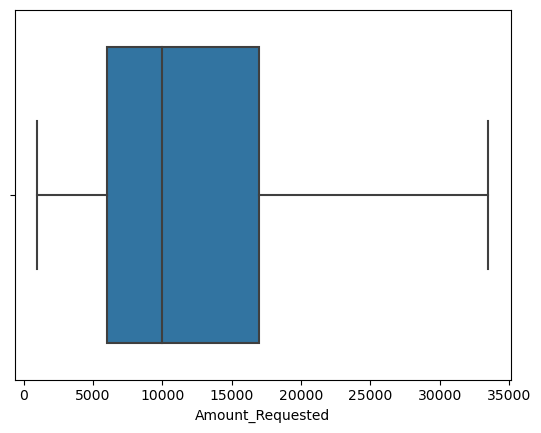

In [182]:
sns.boxplot(num_data2.Amount_Requested)

In [183]:
num_data.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Funded_By_Investors'>

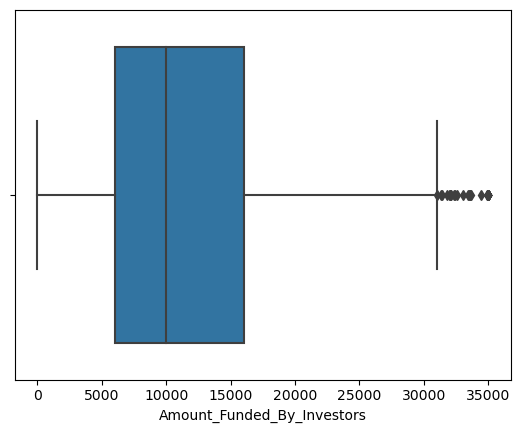

In [184]:
sns.boxplot(num_data2.Amount_Funded_By_Investors)

In [185]:
num_data2['Amount_Requested'] = num_data2.Amount_Funded_By_Investors.clip(lower = lc, upper = uc)

In [186]:
#The variables on which we have to put the outliers are 

# Outlier treatment IQR method

In [187]:
def outlier_IQR(s):
    m = s.quantile(0.5)
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    q_1p = s.quantile(0.01)
    q_99p = s.quantile(0.99)
    iqr = q3 - q1
    lc = q1 - 1.5*iqr
    uc = q3 + 1.5*iqr
    result = pd.Series([m,q1,q3,q_1p,q_99p,iqr,lc,uc])
    result.index = ['median','first_quartile','third_quartile','pc_1','pc_99','iqr','lower_cutoff','upper_cutoff']
    return result

In [188]:
def outliertreat_IQR(d):
    m = d.quantile(0.5)
    q1 = d.quantile(0.25)
    q3 = d.quantile(0.75)
    q_1p = d.quantile(0.01)
    q_99p = d.quantile(0.99)
    iqr = q3 - q1
    lc = q1 - 1.5*iqr
    uc = q3 + 1.5*iqr
    return lc,uc

In [189]:
num_data.apply(outliertreat_IQR)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,-1248.0,-10500.0,-9000.0,1.70,36.0,-6.6375,-1450.0,612.5,-2.0,-14305.5,-1.5,-10.0
1,3748.0,33500.0,31000.0,24.26,36.0,37.0625,11750.0,792.5,22.0,38742.5,2.5,22.0


In [190]:
num_data2.apply(outlier_IQR)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
median,1250.00,10000.0000,10000.0000,13.1100,36.0,15.3200,5000.0000,700.0,9.0,10948.00,0.0,5.0
first_quartile,625.50,6000.0000,6000.0000,10.1600,36.0,9.7500,3500.0000,680.0,7.0,5587.50,0.0,2.0
third_quartile,1874.50,16000.0000,16000.0000,15.8000,36.0,20.6750,6800.0000,725.0,13.0,18849.50,1.0,10.0
pc_1,25.98,998.3456,998.3456,5.9860,36.0,0.7180,1416.4032,660.0,3.0,0.00,0.0,1.0
pc_99,2474.02,33500.0000,35000.0000,22.9566,60.0,33.2300,18750.0000,805.0,23.0,92416.32,5.0,10.0
iqr,1249.00,10000.0000,10000.0000,5.6400,0.0,10.9250,3300.0000,45.0,6.0,13262.00,1.0,8.0
lower_cutoff,-1248.00,-9000.0000,-9000.0000,1.7000,36.0,-6.6375,-1450.0000,612.5,-2.0,-14305.50,-1.5,-10.0
upper_cutoff,3748.00,31000.0000,31000.0000,24.2600,36.0,37.0625,11750.0000,792.5,22.0,38742.50,2.5,22.0


In [191]:
cutoffs = pd.DataFrame(num_data2.apply(outliertreat_IQR))
cutoffs

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,-1248.0,-9000.0,-9000.0,1.70,36.0,-6.6375,-1450.0,612.5,-2.0,-14305.5,-1.5,-10.0
1,3748.0,31000.0,31000.0,24.26,36.0,37.0625,11750.0,792.5,22.0,38742.5,2.5,22.0


### Made two copies of numerical data and will make two models on each of them and will decide later which one is giving better predictiona and minimum RMSPE OR MAPE error.

In [192]:
num_data_2a = num_data.copy()
num_data_2b = num_data.copy()

# Outlier treatment of only required columns:

In [193]:
num_data_2a.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


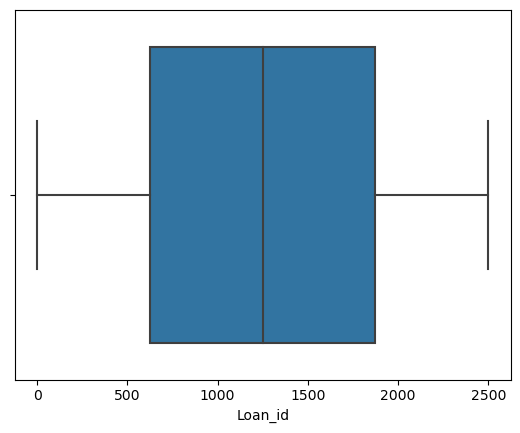

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


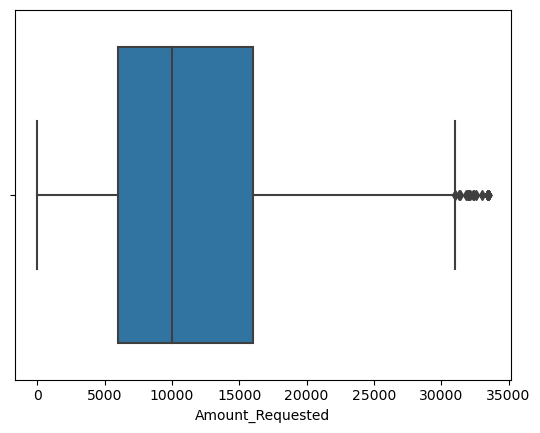

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


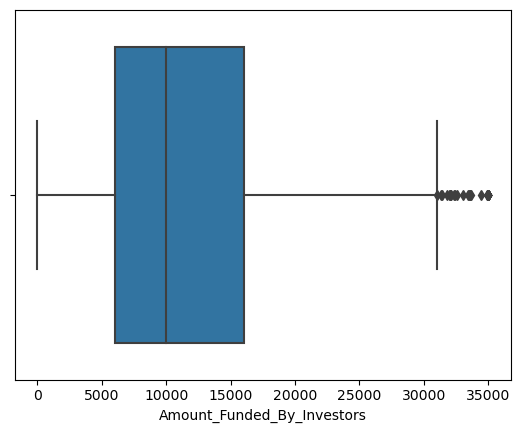

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


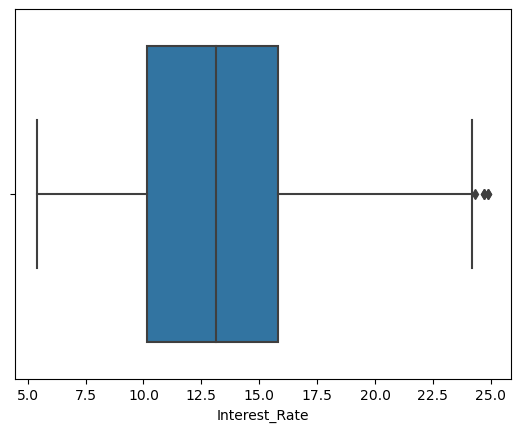

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


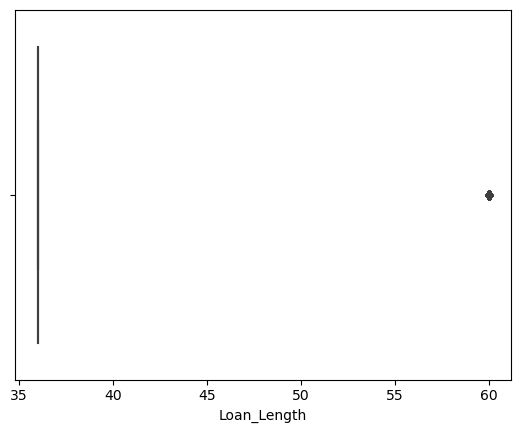

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


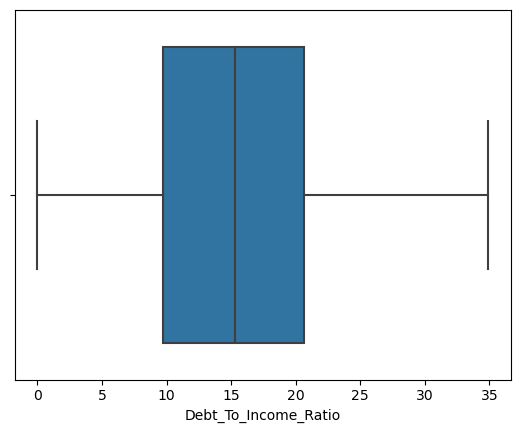

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


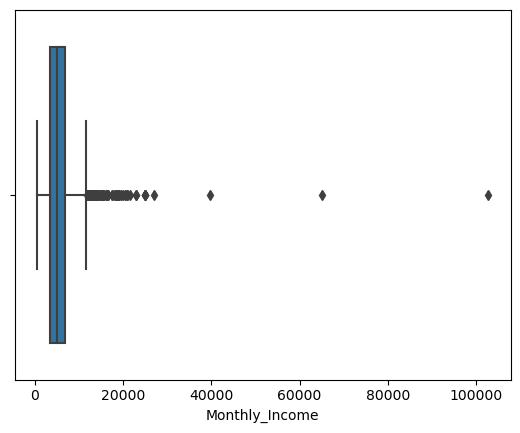

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


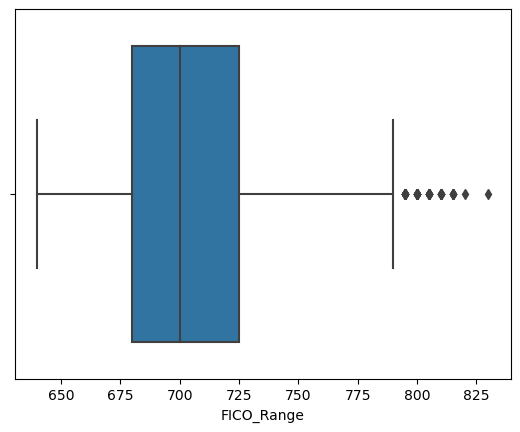

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


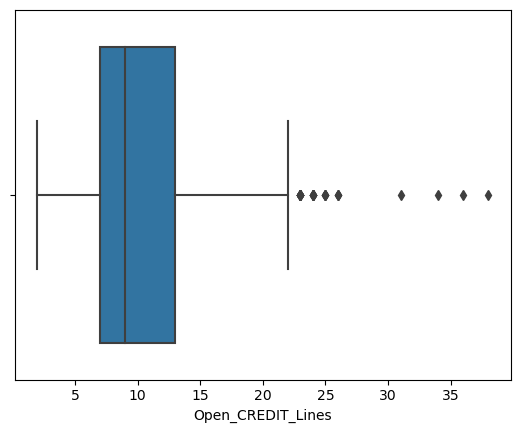

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


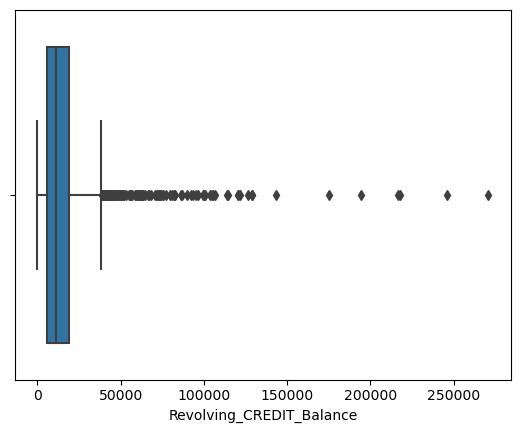

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


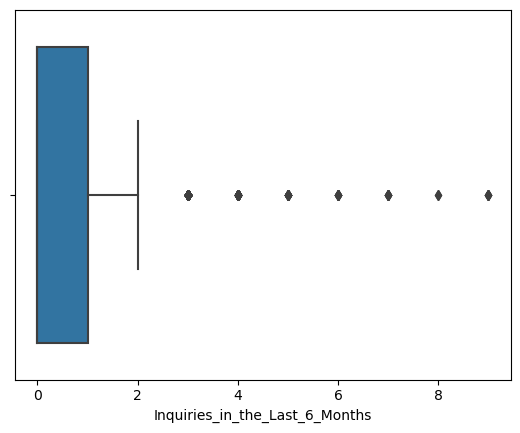

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


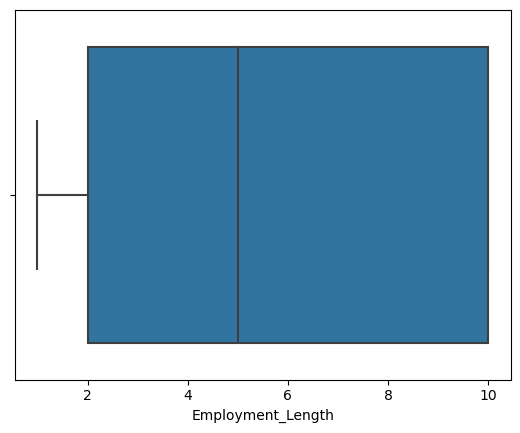

In [194]:
for col in num_data2:
    sns.boxplot(num_data2[col])
    plt.show()

In [195]:
num_data2.Inquiries_in_the_Last_6_Months.value_counts()

0.0    1252
1.0     657
2.0     335
3.0     169
4.0      50
5.0      14
6.0       8
7.0       7
9.0       5
8.0       2
Name: Inquiries_in_the_Last_6_Months, dtype: int64

In [196]:
l = ['Amount_Requested','Amount_Funded_By_Investors','Interest_rate','FICO_Range','Open_CREDIT_Lines','Inquiries_in_the_Last_6_Months']

In [197]:
num_data.apply(outliertreat_IQR)
#num_data2['Amount_Requested'] = num_data2.Amount_Funded_By_Investors.clip(lower = lc, upper = uc)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,-1248.0,-10500.0,-9000.0,1.70,36.0,-6.6375,-1450.0,612.5,-2.0,-14305.5,-1.5,-10.0
1,3748.0,33500.0,31000.0,24.26,36.0,37.0625,11750.0,792.5,22.0,38742.5,2.5,22.0


# Amount Requested

In [198]:
num_data_2a['Amount_Requested'] = num_data_2a.Amount_Requested.clip(lower = -10500.00, upper = 33500)

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Requested'>

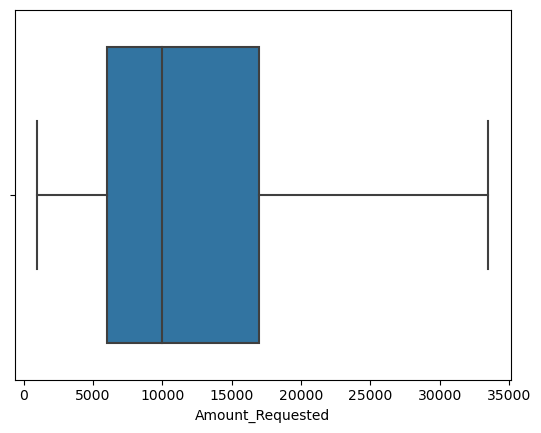

In [199]:
sns.boxplot(num_data_2a.Amount_Requested)

# Amount_funded_by_investors

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Amount_Requested'>

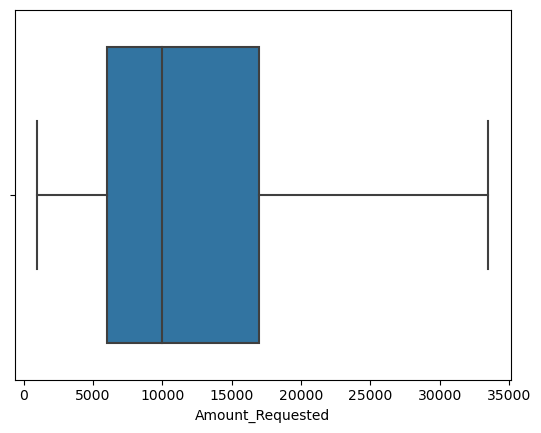

In [200]:
num_data_2a['Amount_Funded_By_Investors'] = num_data_2a.Amount_Funded_By_Investors.clip(lower = -9000, upper = 31000)
sns.boxplot(num_data_2a.Amount_Requested)

# Interest RaTE

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Interest_Rate'>

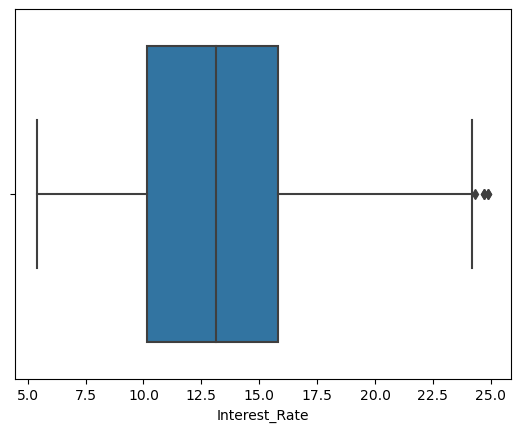

In [202]:
# num_data_2a['Interest Rate'] = num_data_2a.Interest_Rate.clip(lower = 1.70, upper = 24.26)
sns.boxplot(num_data_2a.Interest_Rate)

# Fico range

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='FICO_Range'>

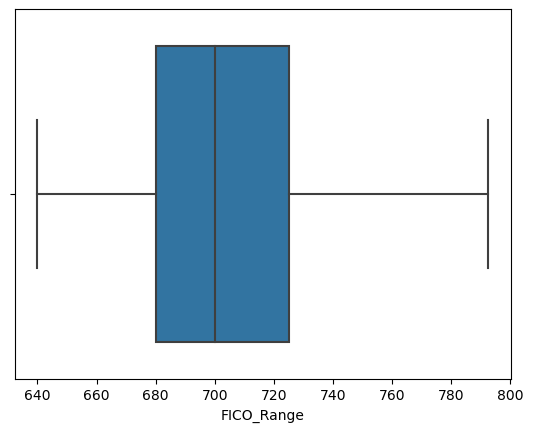

In [203]:
num_data_2a['FICO_Range'] = num_data_2a.FICO_Range.clip(lower = 612.5, upper = 792.5)
sns.boxplot(num_data_2a.FICO_Range)

# open Credit lines

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Open_CREDIT_Lines'>

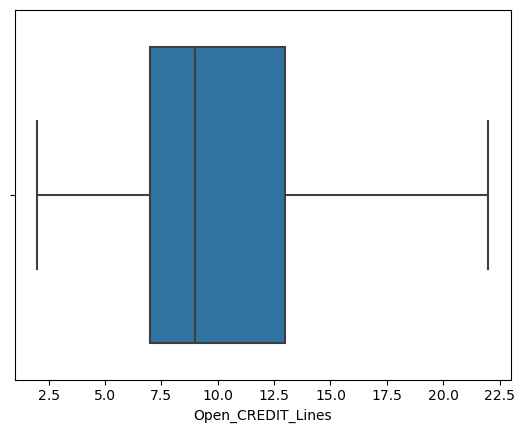

In [204]:
num_data_2a['Open_CREDIT_Lines'] = num_data_2a.Open_CREDIT_Lines.clip(lower = -2.0, upper = 22.0)
sns.boxplot(num_data_2a.Open_CREDIT_Lines)

# Inquiries_in_the_Last_6_Months

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Inquiries_in_the_Last_6_Months'>

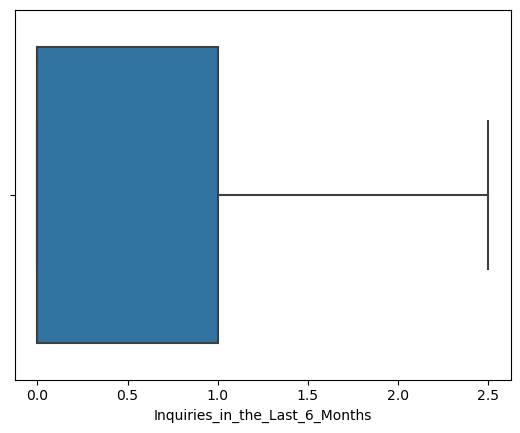

In [205]:
num_data_2a['Inquiries_in_the_Last_6_Months'] = num_data_2a.Inquiries_in_the_Last_6_Months.clip(lower = -1.5, upper = 2.5)
sns.boxplot(num_data_2a.Inquiries_in_the_Last_6_Months)

In [206]:
num_data_2a


,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,Interest Rate
0,1,20000.0,20000.00,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,8.90
1,2,19200.0,19200.00,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,12.12
2,3,33500.0,31000.00,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0,21.98
3,4,10000.0,9975.00,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0,9.99
4,5,12000.0,12000.00,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0,11.71
5,6,6000.0,6000.00,15.31,36.0,20.05,4891.67,670.0,17.0,10391.0,2.0,3.0,15.31
6,7,10000.0,10000.00,7.90,36.0,26.09,2916.67,720.0,10.0,15957.0,0.0,10.0,7.90
7,8,33500.0,31000.00,17.14,60.0,14.70,13863.42,705.0,12.0,27874.0,0.0,10.0,17.14
8,9,14675.0,14675.00,14.33,36.0,26.92,3150.00,685.0,9.0,7246.0,1.0,8.0,14.33
9,10,7000.0,7000.00,6.91,36.0,7.10,5000.00,715.0,8.0,7612.0,0.0,3.0,6.91


# Outlier treatment on all columns in num_data_2b

In [207]:
num_data_2b.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

In [209]:
num_data_2b.head()

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0


In [210]:
num_data_2b.Amount_Requested.quantile(0.25)

6000.0

In [211]:
for col in num_data_2b.columns:
    q1 = num_data_2b[col].quantile(0.25)
    q3 = num_data_2b[col].quantile(0.75)
    iqr = q3 - q1
    lc = q1 - 1.5*iqr
    uc = q3 + 1.5*iqr
    num_data_2b[col] = num_data_2b[col].clip(lower = lc, upper = uc)
    
    
    

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


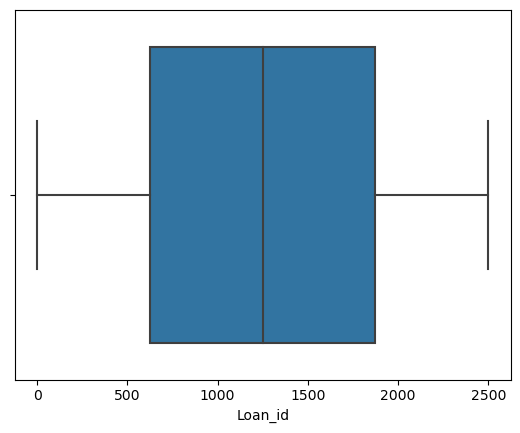

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


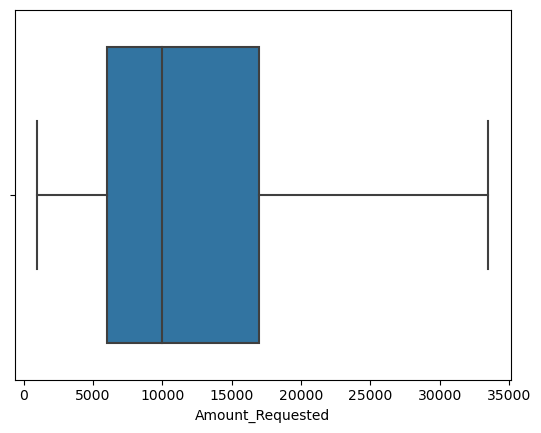

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


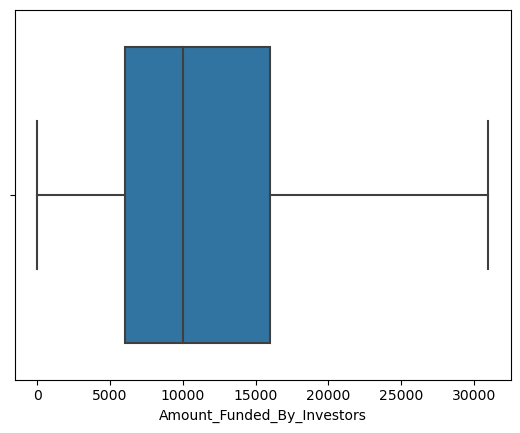

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


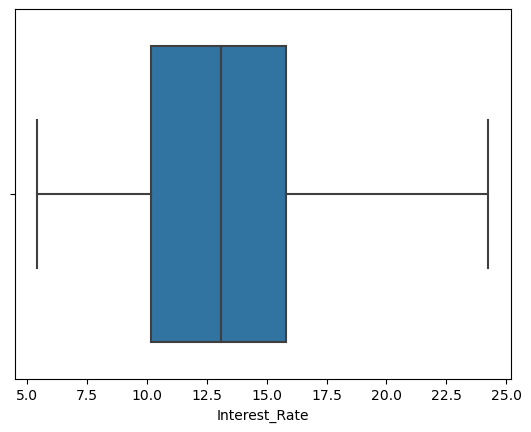

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


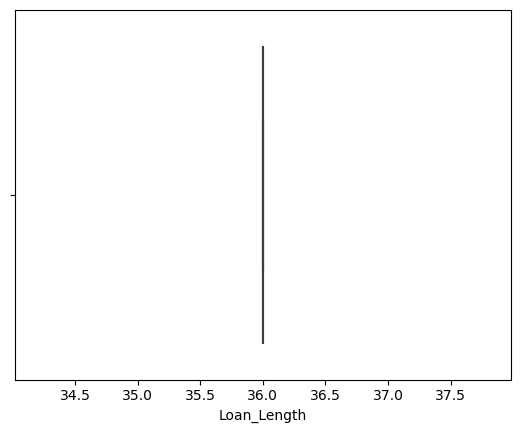

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


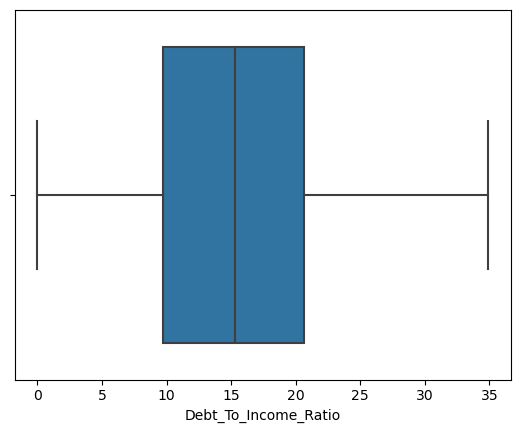

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


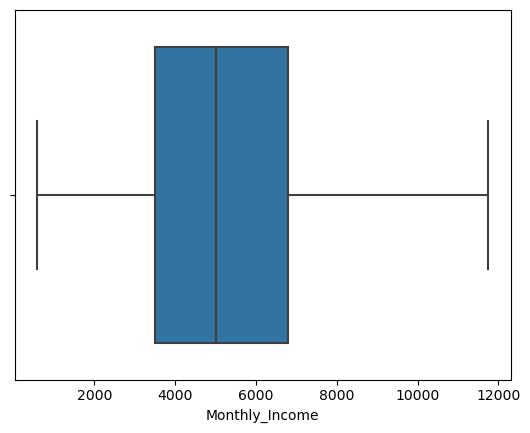

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


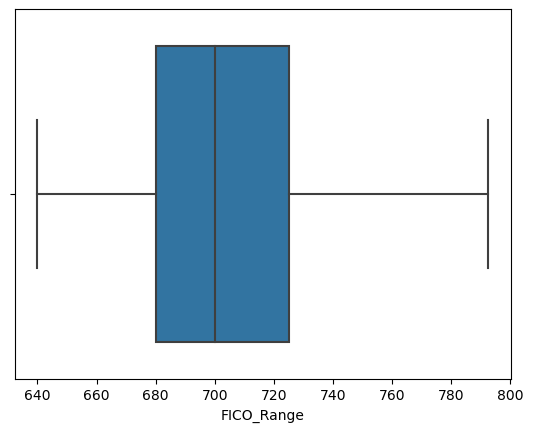

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


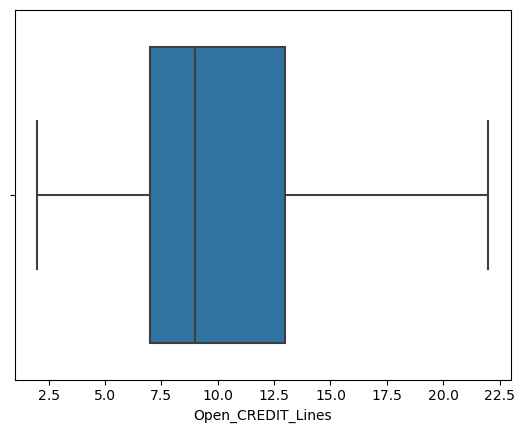

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


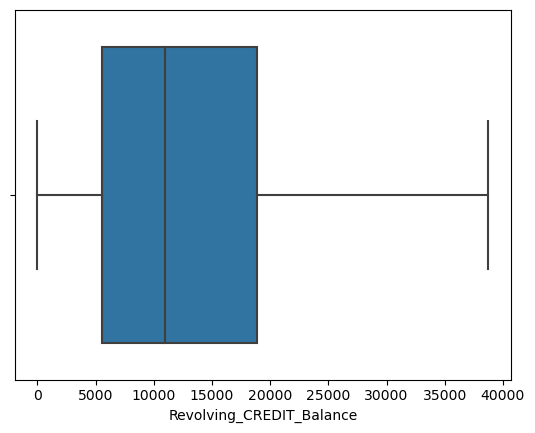

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


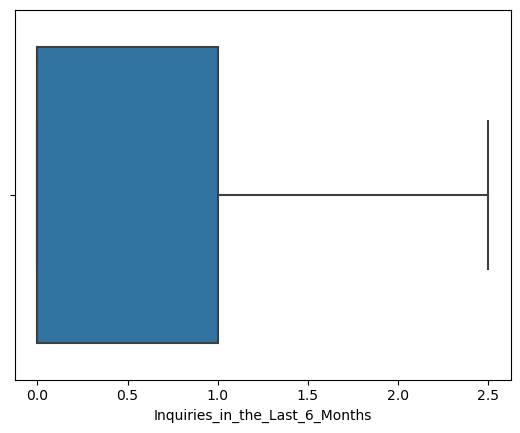

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


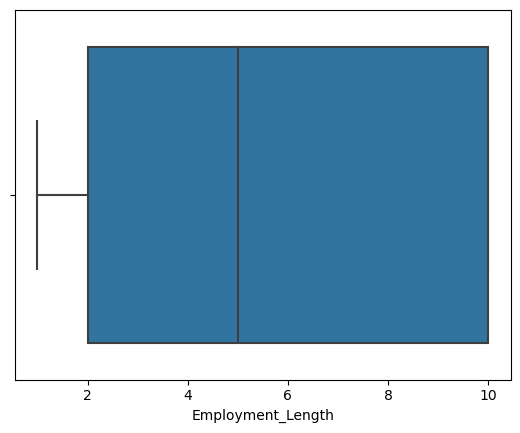

In [212]:
for col in num_data_2b:
    sns.boxplot(num_data_2b[col])
    plt.show()
    

In [213]:
num_data_2a.head(2)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,Interest Rate
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,8.90
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,12.12


In [214]:
num_data_2a.shape

(2499, 13)

In [215]:
num_data_2a = num_data_2a.drop(columns = 'Interest Rate')

In [216]:
num_data_2a.shape

(2499, 12)

In [217]:
num_data_2b.shape

(2499, 12)

In [218]:
num_data_2a.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

In [219]:
num_data_2b.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length'],
      dtype='object')

In [220]:
num_data_2b.head(2)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0


In [221]:
num_data_2b.shape

(2499, 12)

In [222]:
cat_data.head(2)

,Loan_Purpose,States,Home_Ownership,Load_id,Loan_id
0,debt_consolidation,SC,MORTGAGE,1,1
1,debt_consolidation,TX,MORTGAGE,2,2


# Merging the categorical and the numerical data to get the dataset:

In [223]:
M_data1 = pd.merge(num_data_2a,cat_data,how = 'inner',left_on = 'Loan_id',right_on = 'Loan_id')

In [224]:
M_data1.shape

(2499, 16)

In [225]:
M_data1.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length', 'Loan_Purpose', 'States', 'Home_Ownership',
       'Load_id'],
      dtype='object')

In [226]:
M_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2499 entries, 0 to 2498
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Loan_id                         2499 non-null   int64  
 1   Amount_Requested                2499 non-null   float64
 2   Amount_Funded_By_Investors      2499 non-null   float64
 3   Interest_Rate                   2499 non-null   float64
 4   Loan_Length                     2499 non-null   float64
 5   Debt_To_Income_Ratio            2499 non-null   float64
 6   Monthly_Income                  2499 non-null   float64
 7   FICO_Range                      2499 non-null   float64
 8   Open_CREDIT_Lines               2499 non-null   float64
 9   Revolving_CREDIT_Balance        2499 non-null   float64
 10  Inquiries_in_the_Last_6_Months  2499 non-null   float64
 11  Employment_Length               2499 non-null   float64
 12  Loan_Purpose                    24

In [227]:
M_data2 = pd.merge(num_data_2b,cat_data,how = 'inner',left_on = 'Loan_id',right_on = 'Loan_id')

In [228]:
M_data2.shape

(2499, 16)

In [229]:
M_data2.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length', 'Loan_Purpose', 'States', 'Home_Ownership',
       'Load_id'],
      dtype='object')

# One-Hot Encoding: Conversion of categorical variables to continuous variables

In [230]:
M_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2499 entries, 0 to 2498
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Loan_id                         2499 non-null   int64  
 1   Amount_Requested                2499 non-null   float64
 2   Amount_Funded_By_Investors      2499 non-null   float64
 3   Interest_Rate                   2499 non-null   float64
 4   Loan_Length                     2499 non-null   float64
 5   Debt_To_Income_Ratio            2499 non-null   float64
 6   Monthly_Income                  2499 non-null   float64
 7   FICO_Range                      2499 non-null   float64
 8   Open_CREDIT_Lines               2499 non-null   float64
 9   Revolving_CREDIT_Balance        2499 non-null   float64
 10  Inquiries_in_the_Last_6_Months  2499 non-null   float64
 11  Employment_Length               2499 non-null   float64
 12  Loan_Purpose                    24

In [231]:
M_data1.Loan_Purpose.nunique()

14

In [232]:
M_data1.Home_Ownership.nunique()

5

In [233]:
M_data1a = M_data1.copy()

In [234]:
M_data1a.shape

(2499, 16)

In [241]:
M_data2a = M_data2.copy()

In [242]:
M_data2a.shape

(2499, 16)

In [235]:
M_data1a = pd.get_dummies(M_data1a,columns = ['Home_Ownership','Loan_Purpose'])

In [236]:
M_data1a.head(5)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,States,Load_id,Home_Ownership_MORTGAGE,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Loan_Purpose_car,Loan_Purpose_credit_card,Loan_Purpose_debt_consolidation,Loan_Purpose_educational,Loan_Purpose_home_improvement,Loan_Purpose_house,Loan_Purpose_major_purchase,Loan_Purpose_medical,Loan_Purpose_moving,Loan_Purpose_other,Loan_Purpose_renewable_energy,Loan_Purpose_small_business,Loan_Purpose_vacation,Loan_Purpose_wedding
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,SC,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,TX,2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,3,33500.0,31000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0,CA,3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0,KS,4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0,NJ,5,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [237]:
M_data1a.shape

(2499, 33)

In [238]:
M_data1a.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length', 'States', 'Load_id', 'Home_Ownership_MORTGAGE',
       'Home_Ownership_NONE', 'Home_Ownership_OTHER', 'Home_Ownership_OWN',
       'Home_Ownership_RENT', 'Loan_Purpose_car', 'Loan_Purpose_credit_card',
       'Loan_Purpose_debt_consolidation', 'Loan_Purpose_educational',
       'Loan_Purpose_home_improvement', 'Loan_Purpose_house',
       'Loan_Purpose_major_purchase', 'Loan_Purpose_medical',
       'Loan_Purpose_moving', 'Loan_Purpose_other',
       'Loan_Purpose_renewable_energy', 'Loan_Purpose_small_business',
       'Loan_Purpose_vacation', 'Loan_Purpose_wedding'],
      dtype='object')

In [243]:
M_data2a = pd.get_dummies(M_data2a,columns = ['Home_Ownership','Loan_Purpose'])
M_data2a.head(5)

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,States,Load_id,Home_Ownership_MORTGAGE,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Loan_Purpose_car,Loan_Purpose_credit_card,Loan_Purpose_debt_consolidation,Loan_Purpose_educational,Loan_Purpose_home_improvement,Loan_Purpose_house,Loan_Purpose_major_purchase,Loan_Purpose_medical,Loan_Purpose_moving,Loan_Purpose_other,Loan_Purpose_renewable_energy,Loan_Purpose_small_business,Loan_Purpose_vacation,Loan_Purpose_wedding
0,1,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,SC,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,TX,2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,3,33500.0,31000.0,21.98,36.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0,CA,3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,4,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0,KS,4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,5,12000.0,12000.0,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0,NJ,5,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [244]:
M_data1a.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2499 entries, 0 to 2498
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Loan_id                          2499 non-null   int64  
 1   Amount_Requested                 2499 non-null   float64
 2   Amount_Funded_By_Investors       2499 non-null   float64
 3   Interest_Rate                    2499 non-null   float64
 4   Loan_Length                      2499 non-null   float64
 5   Debt_To_Income_Ratio             2499 non-null   float64
 6   Monthly_Income                   2499 non-null   float64
 7   FICO_Range                       2499 non-null   float64
 8   Open_CREDIT_Lines                2499 non-null   float64
 9   Revolving_CREDIT_Balance         2499 non-null   float64
 10  Inquiries_in_the_Last_6_Months   2499 non-null   float64
 11  Employment_Length                2499 non-null   float64
 12  States              

# Logarithmic Transformations

In [245]:
#To convert a data distribution into a normal distribution curve, we can apply various types of transformations on the data:
#Logarithmic, Exponential, Sqquare, Cube, sqrt, cbrt etc.

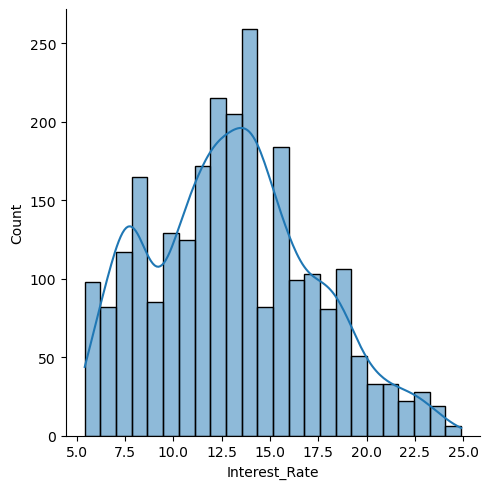

In [246]:
sns.displot(num_data.Interest_Rate,kde = True)
#kde is actually an operator which provides a curve to the histograms and aslo defines the function of the curve.

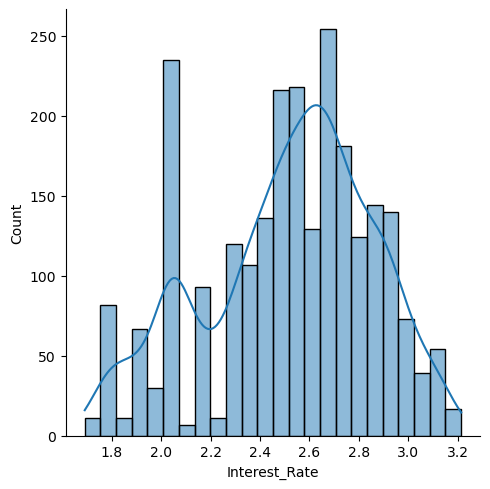

In [247]:
sns.displot(np.log(num_data.Interest_Rate),kde = True)

# ##Check all the variables distribution after logarithmic transformation

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


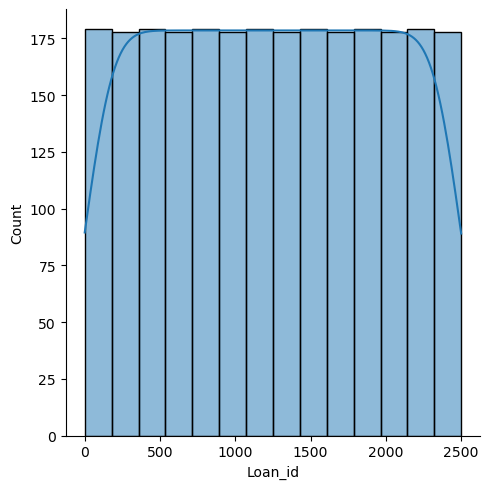

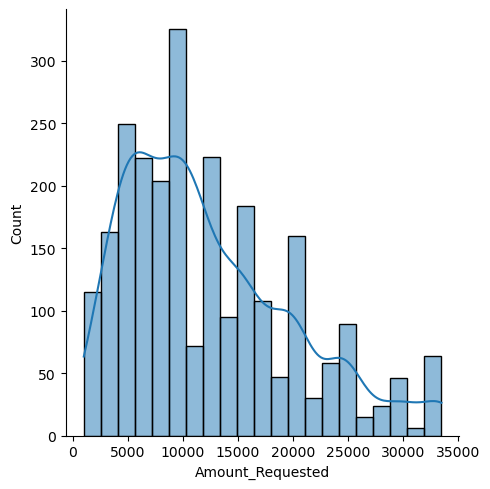

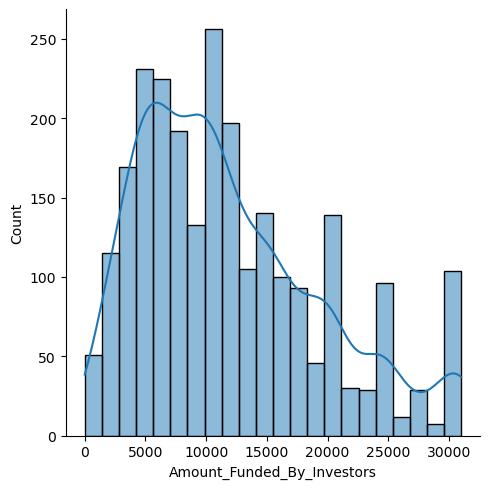

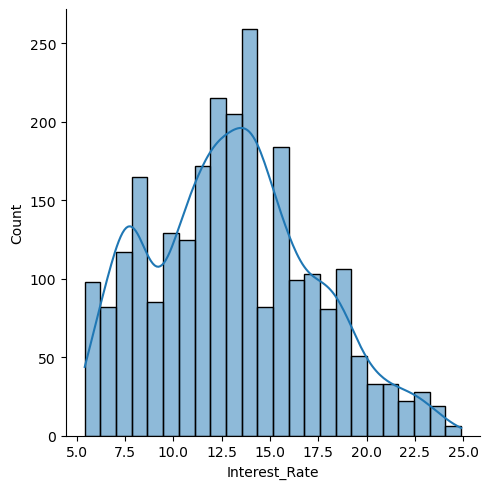

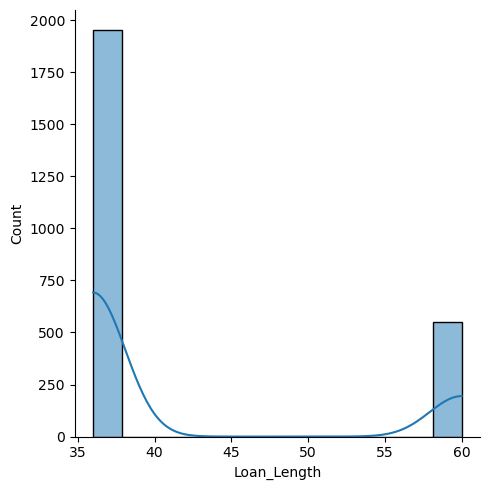

...

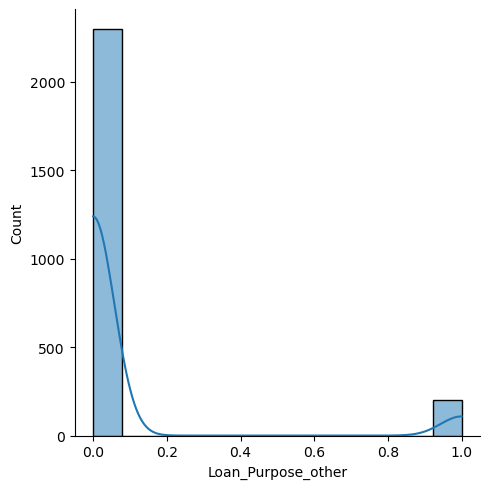

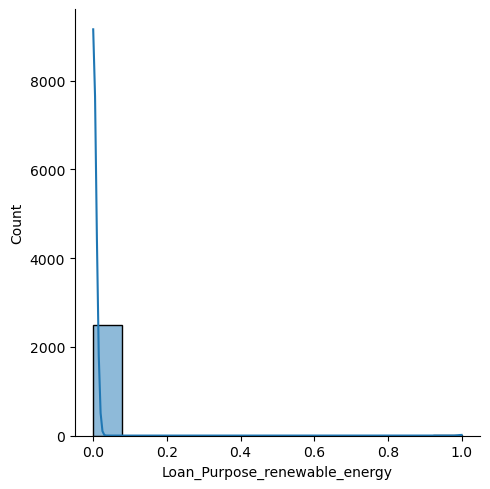

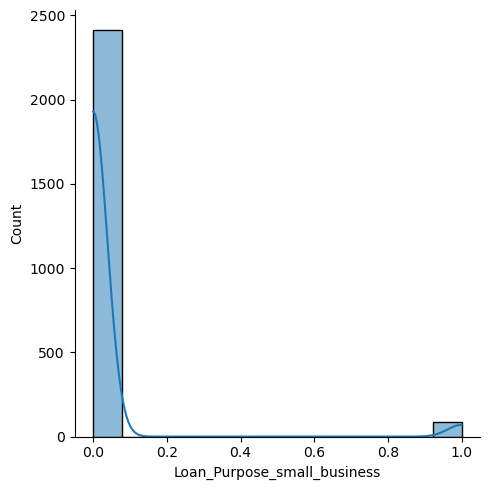

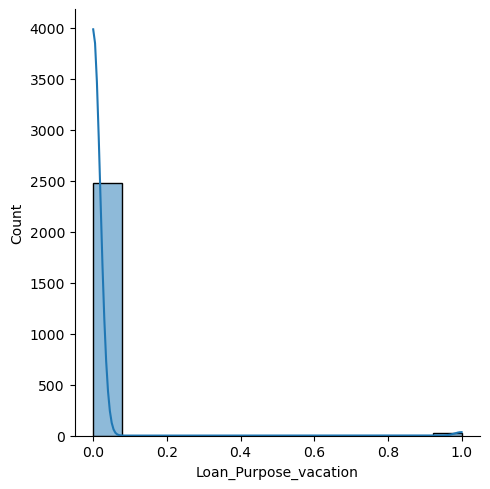

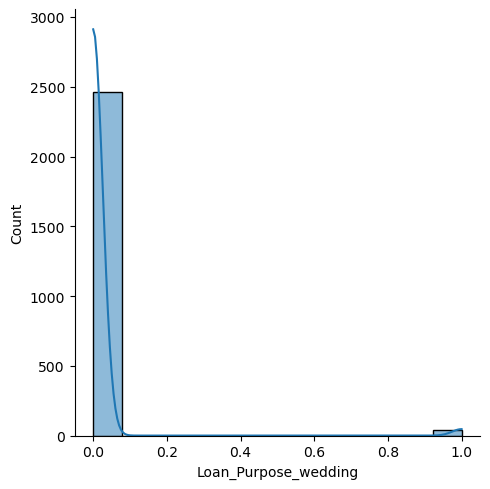

In [249]:
for col in M_data1a.columns:
    sns.displot(M_data1a[col],kde = True)

C:\Users\ASUS\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ASUS\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ASUS\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ASUS\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ASUS\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


TypeError: loop of ufunc does not support argument 0 of type str which has no callable log method

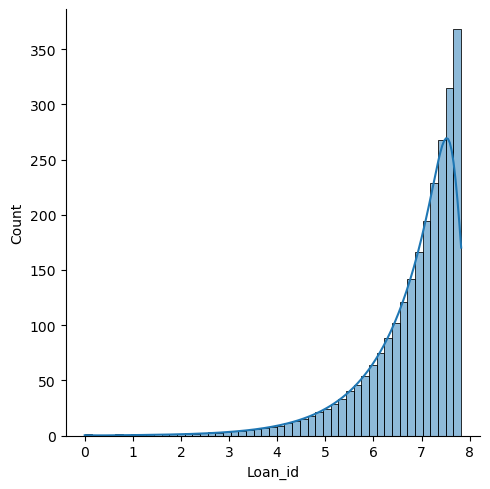

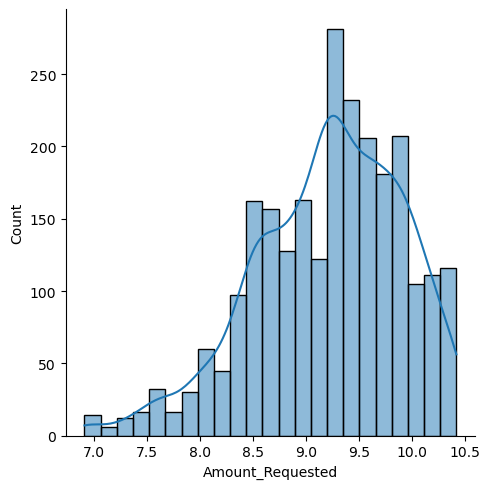

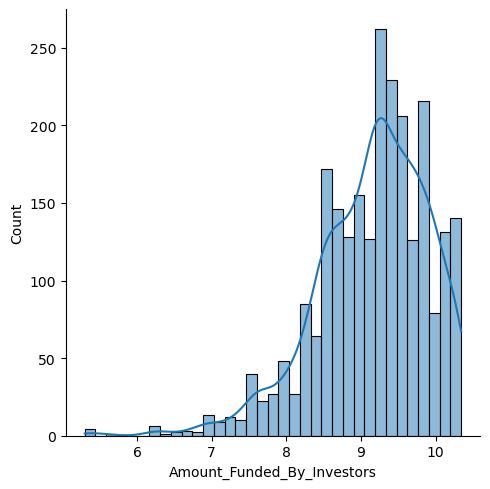

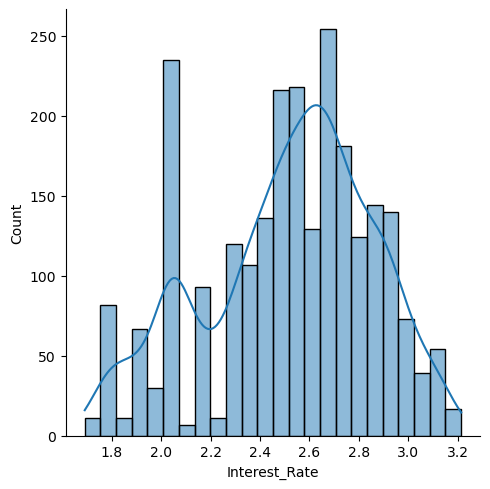

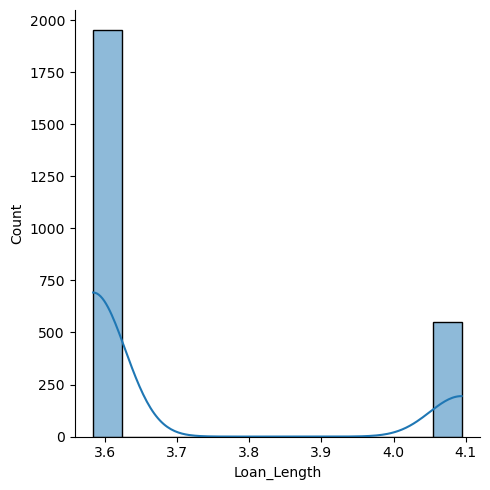

...

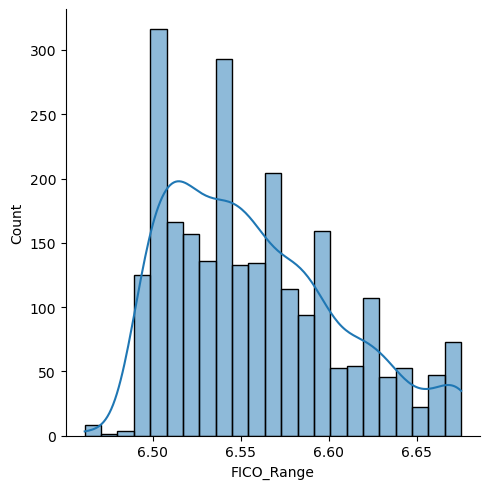

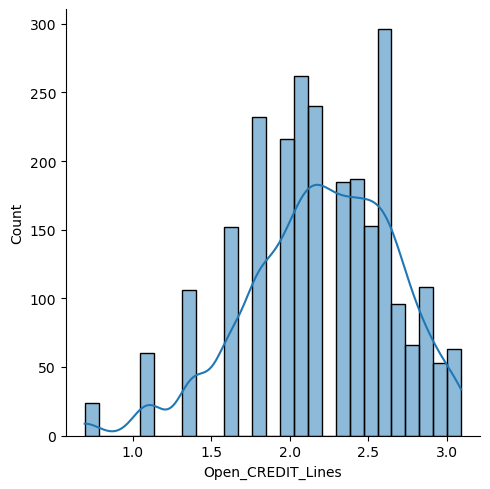

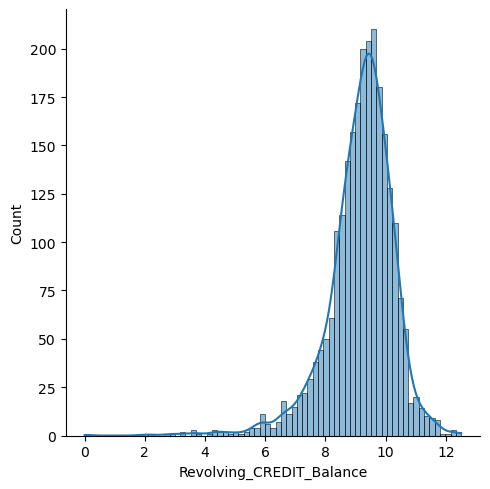

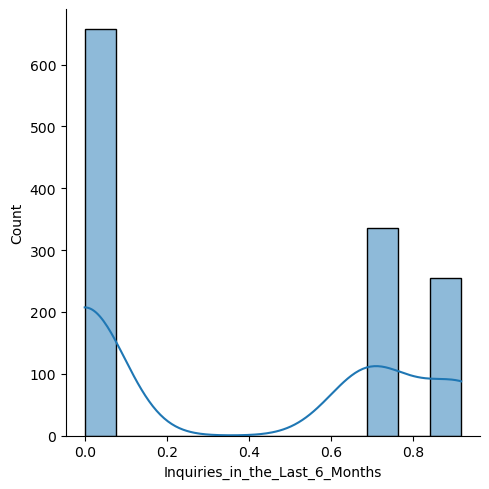

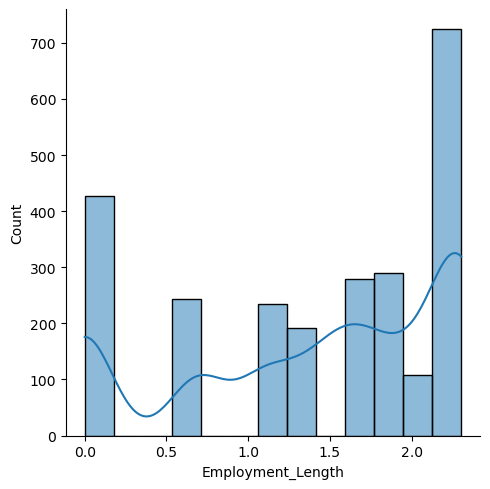

In [250]:
for col in M_data1a.columns:
    sns.displot(np.log(M_data1a[col]),kde = True)

# Standardisation of the numerical data

In [251]:
from scipy import stats

In [252]:
num_data

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,1,20000.0,20000.00,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0
1,2,19200.0,19200.00,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0
2,3,35000.0,35000.00,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0
3,4,10000.0,9975.00,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0
4,5,12000.0,12000.00,11.71,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0
5,6,6000.0,6000.00,15.31,36.0,20.05,4891.67,670.0,17.0,10391.0,2.0,3.0
6,7,10000.0,10000.00,7.90,36.0,26.09,2916.67,720.0,10.0,15957.0,0.0,10.0
7,8,33500.0,33450.00,17.14,60.0,14.70,13863.42,705.0,12.0,27874.0,0.0,10.0
8,9,14675.0,14675.00,14.33,36.0,26.92,3150.00,685.0,9.0,7246.0,1.0,8.0
9,10,7000.0,7000.00,6.91,36.0,7.10,5000.00,715.0,8.0,7612.0,0.0,3.0


In [253]:
num_data_z = num_data.apply(stats.zscore)   #STANDARDISATION OF THE DATA

In [254]:
num_data_z

,Loan_id,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length
0,-1.731350,0.973400,1.032497,-0.997968,-0.529983,-0.064026,0.215228,0.830800,0.871806,-0.051989,0.889667,-1.320690
1,-1.729964,0.870843,0.929197,-0.226729,-0.529983,1.729792,-0.279011,0.259835,0.427729,-0.223420,0.077065,-1.025563
2,-1.728578,2.896330,2.969356,2.134889,1.886854,1.123412,1.466594,-0.453870,0.871806,0.369748,0.077065,-1.025563
3,-1.727192,-0.308554,-0.261971,-0.736897,-0.529983,-0.143988,-0.468293,-0.311129,-0.016349,-0.321616,-0.735536,-0.140182
4,-1.725805,-0.052163,-0.000495,-0.324931,-0.529983,0.453063,-0.629393,-0.311129,0.205690,-0.041206,-0.735536,1.040325
5,-1.724419,-0.821335,-0.775239,0.537324,-0.529983,0.622316,-0.201193,-1.024834,1.537922,-0.264417,0.889667,-0.730436
6,-1.723033,-0.308554,-0.258743,-1.237483,-0.529983,1.427268,-0.699637,0.402576,-0.016349,0.040241,-0.735536,1.335452
7,-1.721647,2.704037,2.769214,0.975636,1.886854,-0.090680,2.063065,-0.025647,0.427729,0.692524,-0.735536,1.335452
8,-1.720261,0.290759,0.344911,0.302599,-0.529983,1.537883,-0.640750,-0.596611,-0.238387,-0.436561,0.077065,0.745199
9,-1.718874,-0.693140,-0.646115,-1.474603,-0.529983,-1.103534,-0.173853,0.259835,-0.460426,-0.416527,-0.735536,-0.730436


In [255]:
M_data1a.shape

(2499, 33)

In [256]:
M_data1a = M_data1a.drop(columns='Loan_id')

In [257]:
M_data1a.shape

(2499, 32)

In [258]:
M_data1a['ln_rate'] = np.log(M_data1a.Interest_Rate)

In [259]:
M_data1a.head(4)

,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,States,Load_id,Home_Ownership_MORTGAGE,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Loan_Purpose_car,Loan_Purpose_credit_card,Loan_Purpose_debt_consolidation,Loan_Purpose_educational,Loan_Purpose_home_improvement,Loan_Purpose_house,Loan_Purpose_major_purchase,Loan_Purpose_medical,Loan_Purpose_moving,Loan_Purpose_other,Loan_Purpose_renewable_energy,Loan_Purpose_small_business,Loan_Purpose_vacation,Loan_Purpose_wedding,ln_rate
0,20000.0,20000.0,8.90,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,SC,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.186051
1,19200.0,19200.0,12.12,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,TX,2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.494857
2,33500.0,31000.0,21.98,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0,CA,3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3.090133
3,10000.0,9975.0,9.99,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0,KS,4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.301585


In [260]:
M_data1a_t2 = M_data1a.copy()

In [261]:
M_data1a_t2 = M_data1a_t2.drop(columns = 'Interest_Rate')

In [262]:
M_data1a_t2.head()

,Amount_Requested,Amount_Funded_By_Investors,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,States,Load_id,Home_Ownership_MORTGAGE,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Loan_Purpose_car,Loan_Purpose_credit_card,Loan_Purpose_debt_consolidation,Loan_Purpose_educational,Loan_Purpose_home_improvement,Loan_Purpose_house,Loan_Purpose_major_purchase,Loan_Purpose_medical,Loan_Purpose_moving,Loan_Purpose_other,Loan_Purpose_renewable_energy,Loan_Purpose_small_business,Loan_Purpose_vacation,Loan_Purpose_wedding,ln_rate
0,20000.0,20000.0,36.0,14.90,6541.67,735.0,14.0,14272.0,2.0,1.0,SC,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.186051
1,19200.0,19200.0,36.0,28.36,4583.33,715.0,12.0,11140.0,1.0,2.0,TX,2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.494857
2,33500.0,31000.0,60.0,23.81,11500.00,690.0,14.0,21977.0,1.0,2.0,CA,3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3.090133
3,10000.0,9975.0,36.0,14.30,3833.33,695.0,10.0,9346.0,0.0,5.0,KS,4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.301585
4,12000.0,12000.0,36.0,18.78,3195.00,695.0,11.0,14469.0,0.0,9.0,NJ,5,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2.460443


In [263]:
M_data1a_t2.shape

(2499, 32)

# Doing the same for the other dataset

In [264]:
M_data2a.columns

Index(['Loan_id', 'Amount_Requested', 'Amount_Funded_By_Investors',
       'Interest_Rate', 'Loan_Length', 'Debt_To_Income_Ratio',
       'Monthly_Income', 'FICO_Range', 'Open_CREDIT_Lines',
       'Revolving_CREDIT_Balance', 'Inquiries_in_the_Last_6_Months',
       'Employment_Length', 'States', 'Load_id', 'Home_Ownership_MORTGAGE',
       'Home_Ownership_NONE', 'Home_Ownership_OTHER', 'Home_Ownership_OWN',
       'Home_Ownership_RENT', 'Loan_Purpose_car', 'Loan_Purpose_credit_card',
       'Loan_Purpose_debt_consolidation', 'Loan_Purpose_educational',
       'Loan_Purpose_home_improvement', 'Loan_Purpose_house',
       'Loan_Purpose_major_purchase', 'Loan_Purpose_medical',
       'Loan_Purpose_moving', 'Loan_Purpose_other',
       'Loan_Purpose_renewable_energy', 'Loan_Purpose_small_business',
       'Loan_Purpose_vacation', 'Loan_Purpose_wedding'],
      dtype='object')

In [265]:
M_data2a = M_data2a.drop(columns='Loan_id')

In [266]:
M_data2a.shape

(2499, 32)

In [267]:
M_data2a['ln_rate'] = np.log(M_data2a.Interest_Rate)   # I have added a new column of the logarithmic output values.

In [268]:
M_data2a_t2 = M_data2a.copy()

In [269]:
M_data2a_t2 = M_data2a_t2.drop(columns = 'Interest_Rate')

In [270]:
M_data2a_t2.shape

(2499, 32)

**M_data1a_t1,M_data2a_t1.....transform only the possible variables**

**Variable Reduction Technique**

# 1) Correlational Analysis

**CHECKING THE LINEARITY OF ALL THE INEPENDENT VARIABLES WITH THE DEPENDENT VARIABLE**

In [271]:
M_data1a_t2.columns

Index(['Amount_Requested', 'Amount_Funded_By_Investors', 'Loan_Length',
       'Debt_To_Income_Ratio', 'Monthly_Income', 'FICO_Range',
       'Open_CREDIT_Lines', 'Revolving_CREDIT_Balance',
       'Inquiries_in_the_Last_6_Months', 'Employment_Length', 'States',
       'Load_id', 'Home_Ownership_MORTGAGE', 'Home_Ownership_NONE',
       'Home_Ownership_OTHER', 'Home_Ownership_OWN', 'Home_Ownership_RENT',
       'Loan_Purpose_car', 'Loan_Purpose_credit_card',
       'Loan_Purpose_debt_consolidation', 'Loan_Purpose_educational',
       'Loan_Purpose_home_improvement', 'Loan_Purpose_house',
       'Loan_Purpose_major_purchase', 'Loan_Purpose_medical',
       'Loan_Purpose_moving', 'Loan_Purpose_other',
       'Loan_Purpose_renewable_energy', 'Loan_Purpose_small_business',
       'Loan_Purpose_vacation', 'Loan_Purpose_wedding', 'ln_rate'],
      dtype='object')

In [272]:
corr = M_data1a_t2.corrwith(M_data1a_t2['ln_rate']).abs().sort_values(ascending = False)
#here I have checked the correlations of each x variable with the y variable(ln_rate)

In [273]:
corr

ln_rate                            1.000000
FICO_Range                         0.746050
Loan_Length                        0.386549
Amount_Funded_By_Investors         0.304867
Amount_Requested                   0.303609
Inquiries_in_the_Last_6_Months     0.196823
Debt_To_Income_Ratio               0.179039
Loan_Purpose_debt_consolidation    0.134903
Loan_Purpose_major_purchase        0.111814
Loan_Purpose_home_improvement      0.099791
Home_Ownership_RENT                0.086603
Home_Ownership_MORTGAGE            0.080256
Loan_Purpose_car                   0.071440
Open_CREDIT_Lines                  0.066235
Revolving_CREDIT_Balance           0.060749
Loan_Purpose_medical               0.045825
Loan_Purpose_educational           0.036409
Employment_Length                  0.035919
Home_Ownership_OTHER               0.032246
Loan_Purpose_renewable_energy      0.031318
Home_Ownership_NONE                0.030107
Loan_Purpose_wedding               0.027313
Loan_Purpose_vacation           

In [ ]:
# plt.figure(figsize = (20,10))
sns.heatmap(M_data1a_t2.corr(), annot = True)
plt.title("Correlational Analysis of all the variables.")

# 1)cutoff value=0.05

# 2)Cutoff_value : mean_value

# 3)Cutoff value : median value

# 4) cutoff_value: 0.03 (as per my intuition)

# 5) cutoff_value: 0.02

In [276]:
M_data1a_t2.shape

(2499, 32)

In [ ]:
v = corr[np.abs(corr)>0.03]
#v1 = corr[np.abs(corr)>0.02]

In [ ]:
v = list(v.index)

In [ ]:
v

In [ ]:
df = M_data1a_t2[v]

In [ ]:
df

In [ ]:
df.head(3)

In [ ]:
df.shape

In [ ]:
M_data2a_t2.shape

In [ ]:
s = corr[np.abs(corr)>0.02]

In [ ]:
s

In [ ]:
scores = pd.DataFrame(s)
scores.reset_index(inplace = True)
scores = scores.rename(columns = {'index':'features',0:'scores'})

In [ ]:
scores = scores[1:]
scores

In [ ]:
s = list(s.index)

In [ ]:
s

In [ ]:
len(s)

In [ ]:
df_1=M_data2a


In [ ]:
df_1

In [ ]:
df

In [ ]:
df.shape

In [ ]:
df['ln_rate'] = M_data1a_t2['ln_rate']

In [ ]:
df.columns

In [ ]:
df.info()

# VIF ANALYSIS: Checking the multicollinearity within the independent variables.

In [ ]:
sns.heatmap(df.corr().abs())

In [ ]:
#Module related to VIF 
#!pip install statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
#Packages for statistical analysis
import pandas_profiling
import scipy.stats as stats

In [ ]:
df.head(3)


In [ ]:
df.columns

In [ ]:
linear = pd.Series(s)
linear = linear[1:]

In [ ]:
linear

In [ ]:
d = df[df.columns.difference(['ln_rate'])]  #difference is also to drop a column.

In [ ]:
d.columns

In [ ]:
d_new = [variance_inflation_factor(d.values,i) for i in range(len(d.columns))] # main code

In [ ]:
d_new = pd.Series(d_new)

In [ ]:
vif_data = pd.concat([pd.Series(d.columns),d_new,scores['scores']],axis = 1)

In [ ]:
vif_data.columns = ['features','VIF_Scores','Correlation_scores']

In [ ]:
vif_data.sort_values(by = 'VIF_Scores', ascending = False)

In [ ]:
scores

In [ ]:
from sklearn.model_selection import train_test_split

# Forward Selection and Backward Elimination Technique

In [ ]:
df_copy = df.copy()    # made a copy of df dataframe so that df is safe for future use.

In [ ]:
D = df_copy.drop(columns = ['ln_rate','Amount_Funded_By_Investors'])
D_new = pd.Series(variance_inflation_factor(D.values,i) for i in range(len(D.columns)))
vif_data = pd.concat([pd.Series(D.columns),D_new], axis = 1)
vif_data.columns = ['features','VIF']
vif_data.sort_values(by = 'VIF', ascending = False)

In [ ]:
D = D.drop(columns = 'FICO_Range')
D_new = pd.Series(variance_inflation_factor(D.values,i) for i in range(len(D.columns)))
vif_data = pd.concat([pd.Series(D.columns),D_new], axis = 1)
vif_data.columns = ['features','VIF']
vif_data.sort_values(by = 'VIF', ascending = False)

In [ ]:
D.columns

In [ ]:
Z = D.drop(columns = ['Loan_Length'])
D_new = pd.Series(variance_inflation_factor(Z.values,i) for i in range(len(Z.columns)))
vif_data = pd.concat([pd.Series(Z.columns),D_new], axis = 1)
vif_data.columns = ['features','VIF']
vif_data.sort_values(by = 'VIF', ascending = False)

In [ ]:
J = D.drop(columns = ['Loan_Length','Open_CREDIT_Lines'])
D_new = pd.Series(variance_inflation_factor(J.values,i) for i in range(len(J.columns)))
vif_data = pd.concat([pd.Series(J.columns),D_new], axis = 1)
vif_data.columns = ['features','VIF']
vif_data.sort_values(by = 'VIF', ascending = False)

# Splitting of the data into Training and Testing dataset: (70% training data, 30% testing data)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
J.columns

In [ ]:
J.shape

In [ ]:
df.shape

In [ ]:
J['log_rate'] = df['ln_rate']

In [ ]:
J.columns

In [ ]:
J.head(2)

# Splitting The datasets into train and test:

In [ ]:
train, test = train_test_split(J,test_size = 0.3, random_state = 123)

In [ ]:
J.shape

In [ ]:
train.shape

In [ ]:
train.head()

In [ ]:
test.shape

In [ ]:
test.head(3)

# Model Building: OLS Regression

In [ ]:
import statsmodels.formula.api as smf

In [ ]:
J.columns

In [ ]:
formula = 'log_rate~'+'+'.join(J.columns.difference(['log_rate','Employment_Length','Loan_Purpose_educational','Loan_Purpose_renewable_energy','Loan_Purpose_educational','Home_Ownership_NONE','Home_Ownership_OTHER','Home_Ownership_RENT','Loan_Purpose_medical','Revolving_CREDIT_Balance','Loan_Purpose_debt_consolidation']))

In [ ]:
ols_model = smf.ols(formula,data = train).fit()
print(ols_model.summary())

# Predict the values on the training dataset using the model.

In [ ]:
np.exp(ols_model.predict(train))

In [ ]:
matrix = pd.DataFrame(round(np.exp(train['log_rate']),2))

In [ ]:
matrix['prediction'] = pd.Series(round(np.exp(ols_model.predict(train)),2))

In [ ]:
matrix

In [ ]:
matrix['absolute_error'] = np.abs(matrix['log_rate'] - matrix['prediction'])

In [ ]:
matrix

In [ ]:
matrix['percent_error'] = round((matrix['absolute_error']/matrix['log_rate'])*100,2)

In [ ]:
matrix

In [ ]:
MAPE = np.mean(matrix['percent_error'])

In [ ]:
MAPE

# Z

In [ ]:
Z.columns

In [ ]:
Z['log_rate'] = df['ln_rate']

In [ ]:
train, test = train_test_split(Z,test_size = 0.3, random_state = 123)

In [ ]:
formula_1 = 'log_rate~'+'+'.join(Z.columns.difference(['log_rate','Employment_Length','Home_Ownership_NONE','Revolving_CREDIT_Balance','Loan_Purpose_educational','Loan_Purpose_renewable_energy','Home_Ownership_OTHER','Home_Ownership_RENT','Loan_Purpose_medical','Loan_Purpose_debt_consolidation']))

In [ ]:
ols_model_2 = smf.ols(formula_1,data = train).fit()
print(ols_model_2.summary())

In [ ]:
np.exp(ols_model_2.predict(train))

In [ ]:
matrix_2 = pd.DataFrame(round(np.exp(train['log_rate']),2))
matrix_2['prediction'] = pd.Series(round(np.exp(ols_model_2.predict(train)),2))
matrix_2['absolute_error'] = np.abs(matrix_2['log_rate'] - matrix_2['prediction'])
matrix_2['percent_error'] = round((matrix_2['absolute_error']/matrix_2['log_rate'])*100,2)
print(matrix_2)
MAPE_Z = np.mean(matrix_2['percent_error'])
print(MAPE_Z)